# Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import requests
import json
import os
import time
import fred_msa
import datetime as dt
from datetime import date
import regex as re
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import VAR

from sklearn.model_selection import TimeSeriesSplit

C:\Users\tgule\Anaconda3\envs\capstone-jlab\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
C:\Users\tgule\Anaconda3\envs\capstone-jlab\lib\site-packages\statsmodels\tsa\base\tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


In [2]:
hpi = pd.read_csv('..\\working-data\\hpi-data.csv')
hpi = hpi.query("year <= 2019")
hpi.date = pd.to_datetime(hpi.date)
#hpi = hpi.set_index(['city', 'msa_state', 'date'])

In [3]:
hpi.head()

,date,quarter,msa_state,year,city,hpi,weekly_wages,rpp,population,gdp,unemployment_rate,crimes,subprime,poverty,patents,private_establishments,premature_death_rate,snap
0,2008-01-01,1,SC,2008,Charleston,361.226779,733.576515,97.6410,647.19400,27277.61300,4.8,10083.0,42.546860,13.983937,7.000000,16277.0,395.327521,69915.00
1,2008-04-01,2,SC,2008,Charleston,355.616583,728.179263,97.6635,650.19325,27192.92025,5.1,10058.5,42.203499,14.355264,6.000000,16760.0,393.136641,73917.75
2,2008-07-01,3,SC,2008,Charleston,344.436457,732.479714,97.6860,653.19250,27108.22750,6.0,10034.0,42.138782,14.726591,4.000000,16960.0,390.945760,77920.50
3,2008-10-01,4,SC,2008,Charleston,341.161607,731.680084,97.7085,656.19175,27023.53475,7.0,10009.5,42.177472,15.097918,4.500000,16680.0,388.754880,81923.25
4,2009-01-01,1,SC,2009,Charleston,344.275399,732.465819,97.7310,659.19100,26938.84200,8.2,9985.0,41.945581,15.469245,3.666667,15846.0,386.564000,85926.00


In [74]:
cols_to_ignore = ['date', 'quarter', 'msa_state', 'year', 'city']
X = np.array(hpi.query("city=='New York'").drop(columns = cols_to_ignore + ['hpi']).reset_index(drop=True))
y = np.array(hpi.query("city=='New York'").hpi.reset_index(drop=True)).reshape(y.shape[0],1)

In [75]:
tscv = TimeSeriesSplit(n_splits=15, max_train_size=5, test_size=3)

In [76]:
for train_index, test_index in tscv.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [0 1 2] TEST: [3 4 5]
TRAIN: [1 2 3 4 5] TEST: [6 7 8]
TRAIN: [4 5 6 7 8] TEST: [ 9 10 11]
TRAIN: [ 7  8  9 10 11] TEST: [12 13 14]
TRAIN: [10 11 12 13 14] TEST: [15 16 17]
TRAIN: [13 14 15 16 17] TEST: [18 19 20]
TRAIN: [16 17 18 19 20] TEST: [21 22 23]
TRAIN: [19 20 21 22 23] TEST: [24 25 26]
TRAIN: [22 23 24 25 26] TEST: [27 28 29]
TRAIN: [25 26 27 28 29] TEST: [30 31 32]
TRAIN: [28 29 30 31 32] TEST: [33 34 35]
TRAIN: [31 32 33 34 35] TEST: [36 37 38]
TRAIN: [34 35 36 37 38] TEST: [39 40 41]
TRAIN: [37 38 39 40 41] TEST: [42 43 44]
TRAIN: [40 41 42 43 44] TEST: [45 46 47]


In [97]:
model = VAR(ny_data)

In [96]:
ny_data = np.concatenate((X,y), axis=1)

In [83]:
ny_data

(48, 13)

In [93]:
y.ndim

2

### Look at HPI by itself

In [4]:
def var_plot(df, col):
    fig, ax = plt.subplots(figsize=(15, 9))
    hpi_plot = sns.lineplot(data=df, x=df.date, y=col, hue='city')
    plt.xticks(rotation=90)
    plt.title(col)

    plt.show()

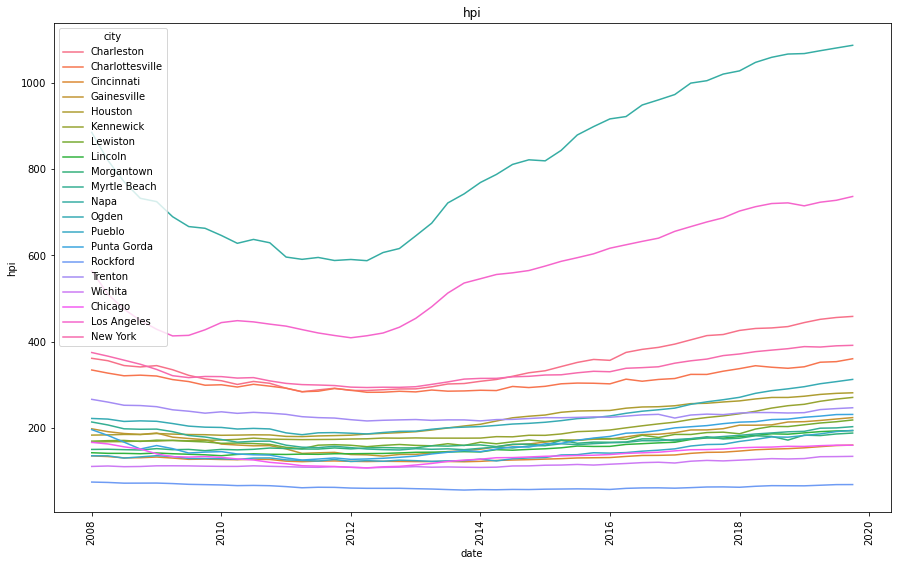

In [5]:
var_plot(hpi, 'hpi')

### Seasonality

In [275]:
seasonal_cols = ['subprime', 'patents', 'private_establishments']
seasonality = {}
for col in seasonal_cols:
    col_df = pd.DataFrame()
    for city in hpi.city.unique():
        city_df = hpi[hpi.city == city]
        city_df = city_df.set_index('date')
        city_decomp = seasonal_decompose(city_df[col], model="add")
        
        city_seasonality = pd.DataFrame({'original' : city_decomp.observed, 'trend' : city_decomp.trend, 'seasonal' : city_decomp.seasonal})
        city_seasonality['diff'] = city_seasonality.original - city_seasonality.trend
        city_seasonality['recon'] = city_seasonality.seasonal + city_seasonality.trend
        city_seasonality['city'] = city
        
        col_df = col_df.append(city_seasonality)
        
    seasonality[col] = col_df.reset_index()

In [276]:
seasonality['subprime']

,date,original,trend,seasonal,diff,recon,city
0,2008-01-01,42.546860,NaN,-0.023212,NaN,NaN,Charleston
1,2008-04-01,42.203499,NaN,-0.235017,NaN,NaN,Charleston
2,2008-07-01,42.138782,42.191493,-0.049804,-0.052711,42.141689,Charleston
3,2008-10-01,42.177472,42.066979,0.308033,0.110493,42.375011,Charleston
4,2009-01-01,41.945581,41.992025,-0.023212,-0.046444,41.968813,Charleston
...,...,...,...,...,...,...,...
955,2018-10-01,23.718218,23.275651,0.381226,0.442568,23.656877,New York
956,2019-01-01,23.224716,23.227561,-0.002446,-0.002845,23.225115,New York
957,2019-04-01,22.828048,23.185633,-0.323298,-0.357585,22.862334,New York
958,2019-07-01,23.062351,NaN,-0.055483,NaN,NaN,New York


C:\Users\tgule\AppData\Local\Temp/ipykernel_23768/2773172800.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


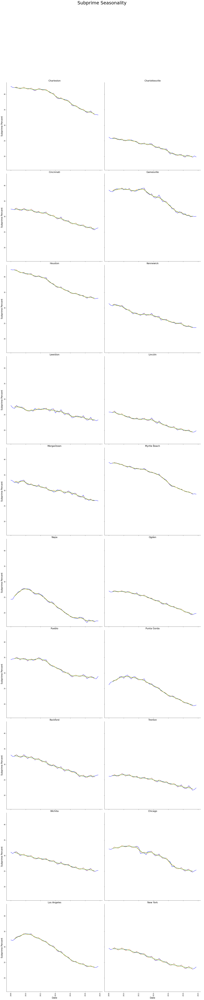

In [292]:
g = sns.FacetGrid(seasonality['subprime'], col = 'city', col_wrap=2, height=10, aspect=1)
g.map(plt.plot, 'date', 'original', linewidth=1.5, color='blue')
g.map(plt.plot, 'date', 'trend', linewidth=1.5, color='green')
g.map(plt.plot, 'date', 'recon', linewidth=1.5, color='orange')
#g.map(plt.axvline(x='observed'))
g.set_titles('{col_name}', size=16)
g.set_axis_labels('Date', 'Subprime Percent', fontsize=16)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Subprime Seasonality', fontsize=32)
g.add_legend()

for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

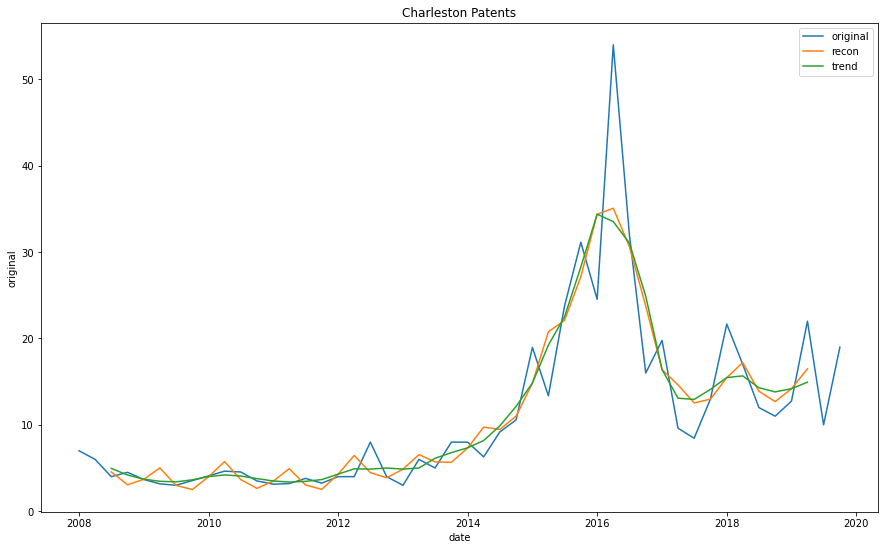

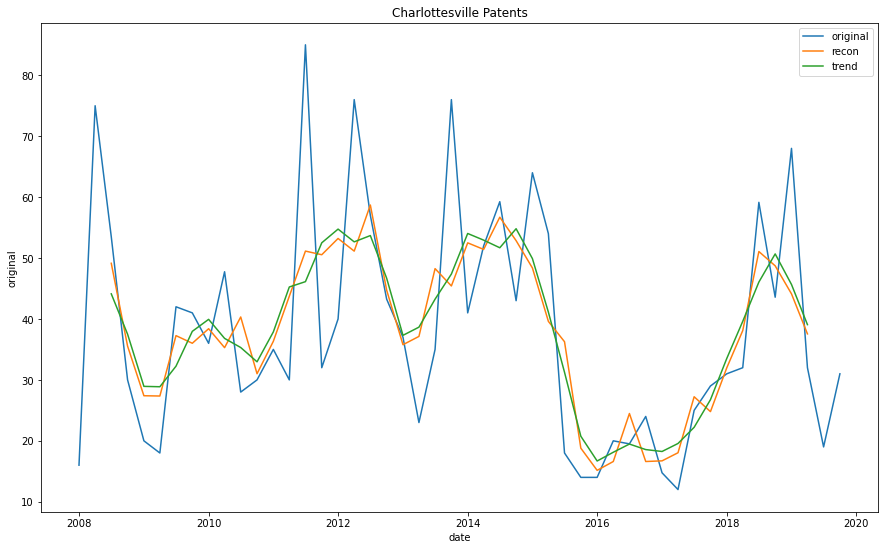

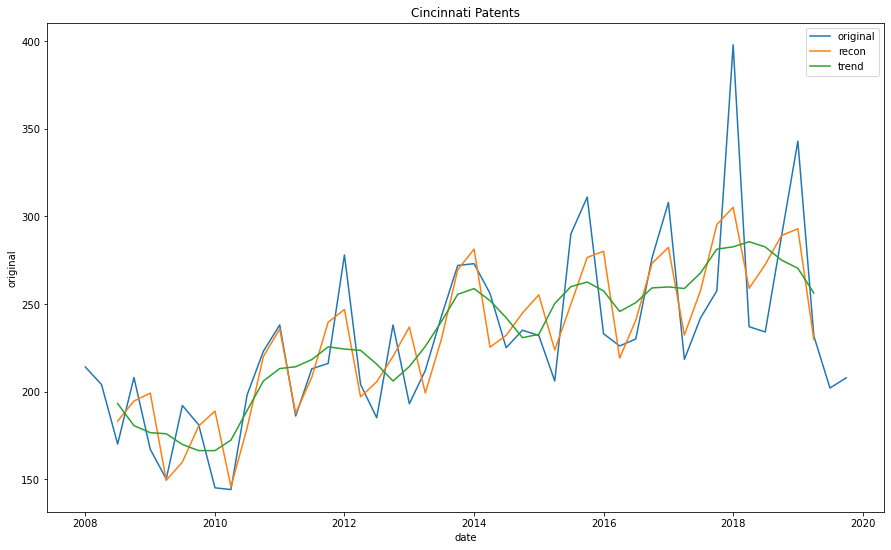

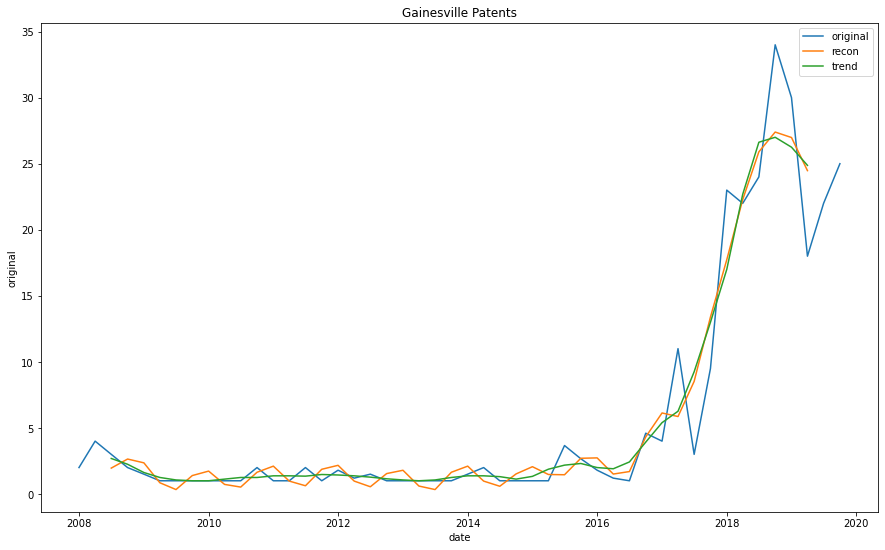

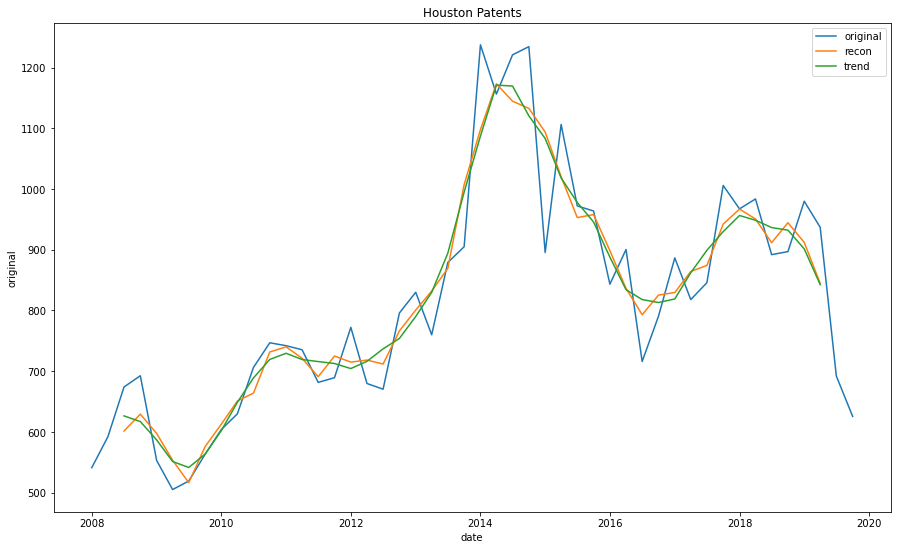

...

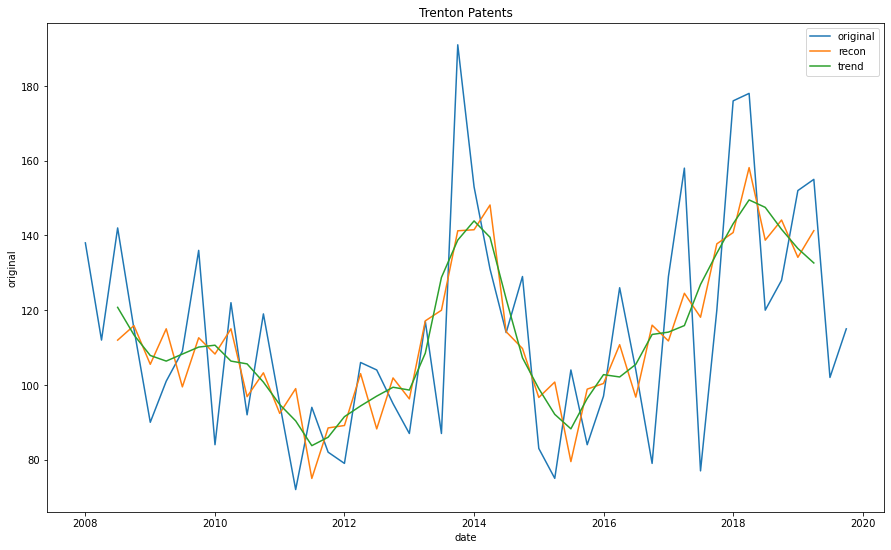

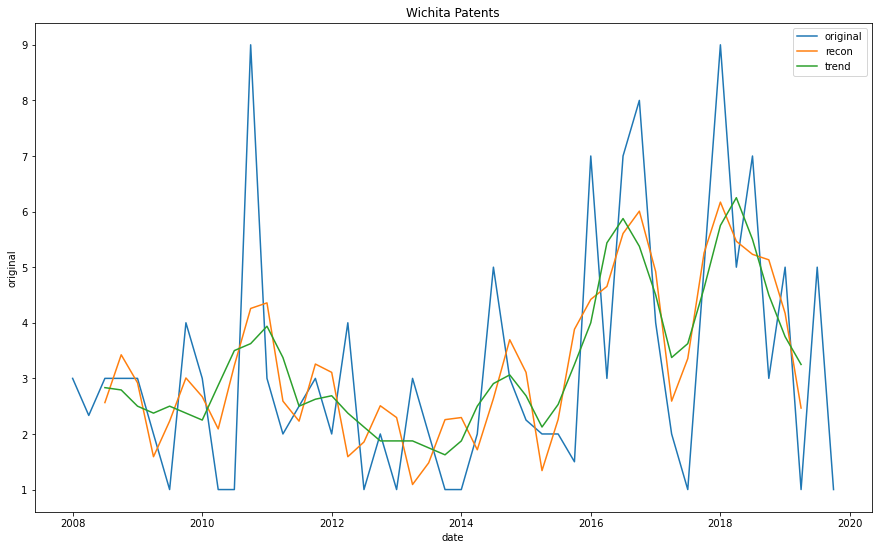

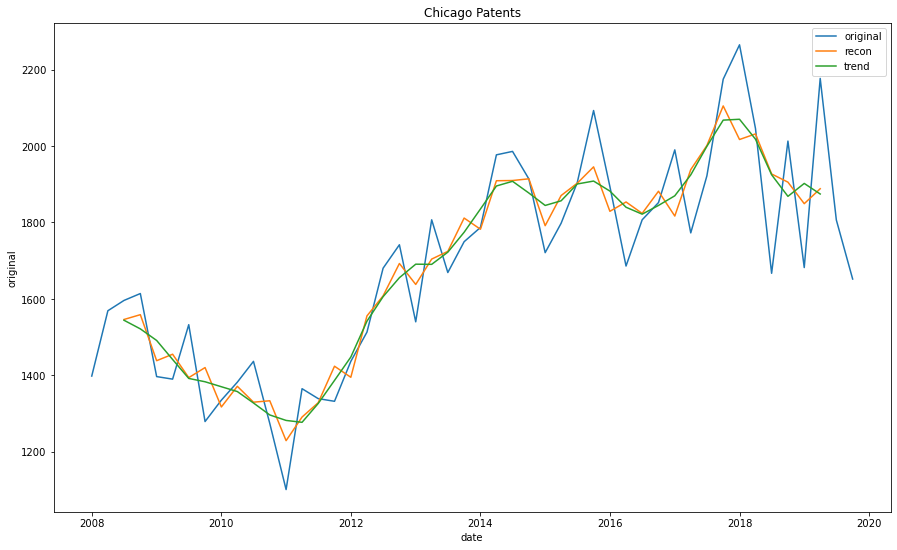

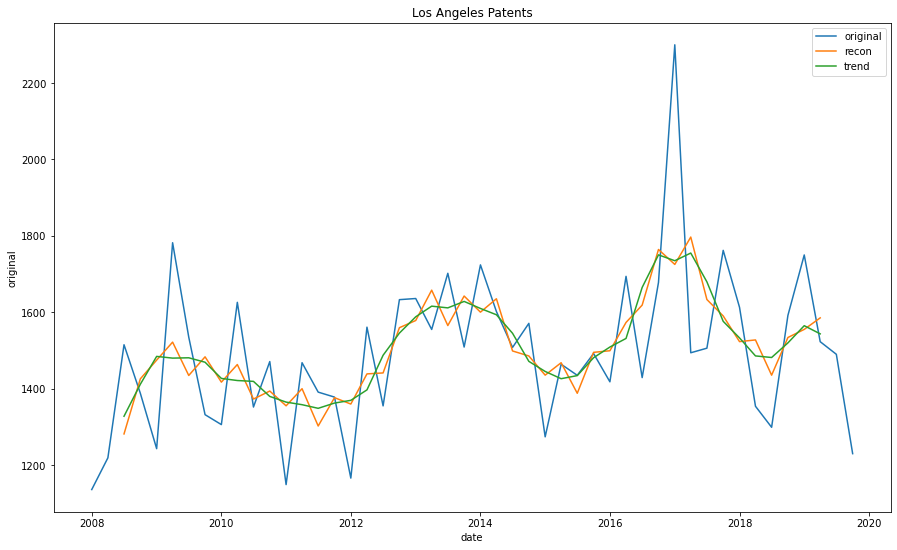

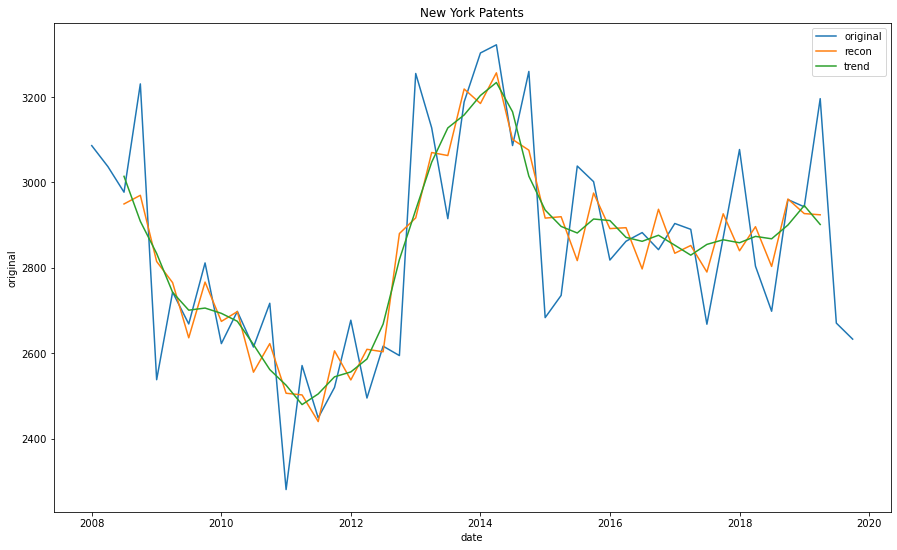

In [299]:
for city in hpi.city.unique():
    df = seasonality['patents']
    city_df = df[df.city == city]
    fig, ax = plt.subplots(figsize=(15, 9))
    sns.lineplot(data=city_df, x='date', y='original', label= 'original')
    sns.lineplot(data=city_df, x='date', y='recon', label= 'recon')
    sns.lineplot(data=city_df, x='date', y='trend', label= 'trend')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='recon')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='trend')
    plt.title(city + ' Patents')
    plt.legend()
    plt.show()

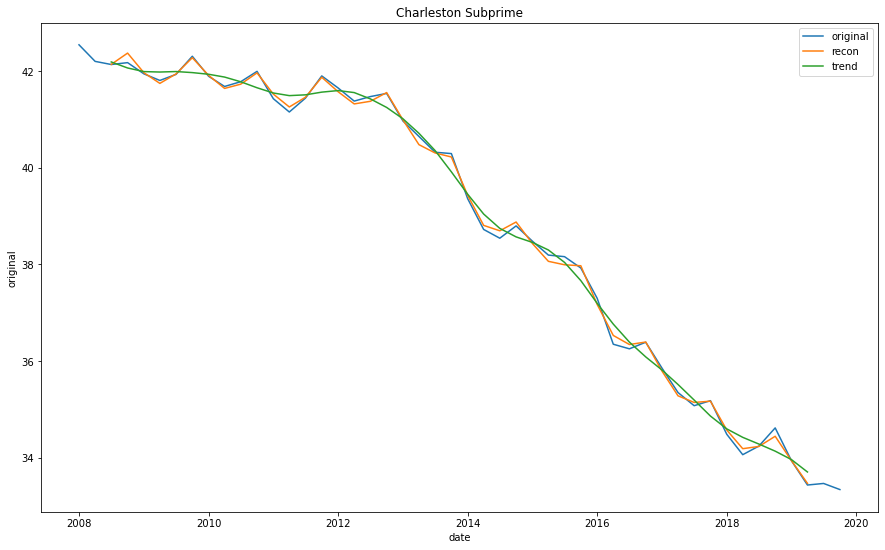

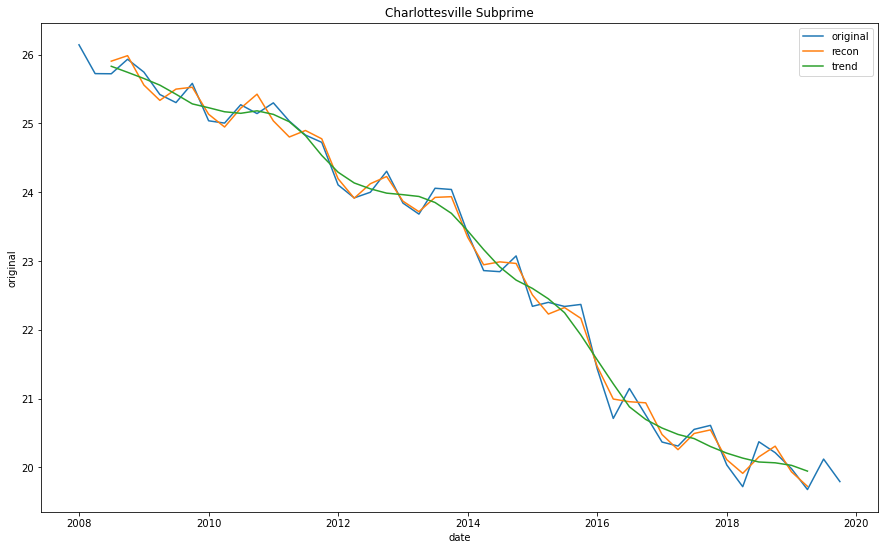

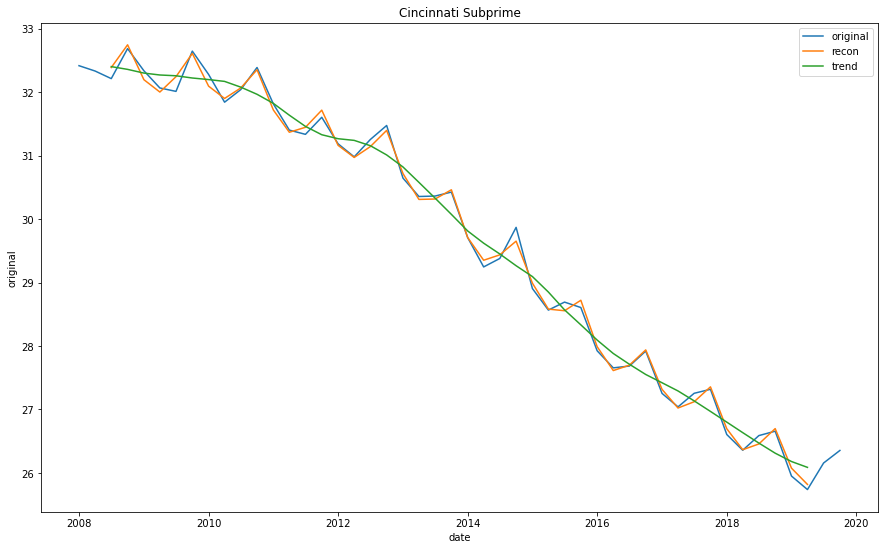

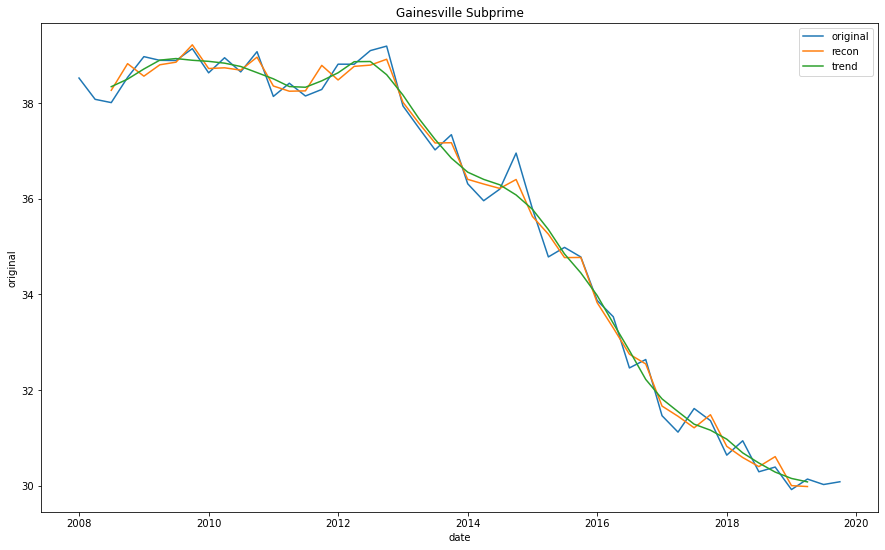

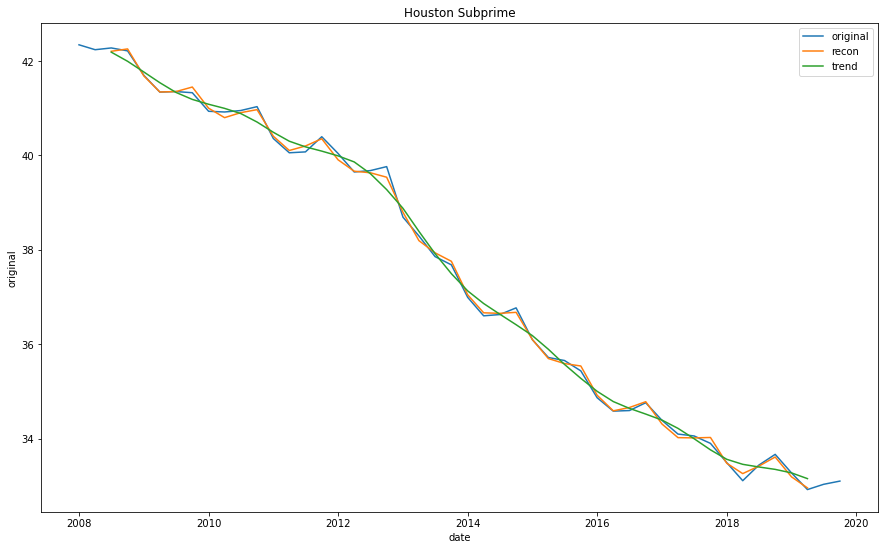

...

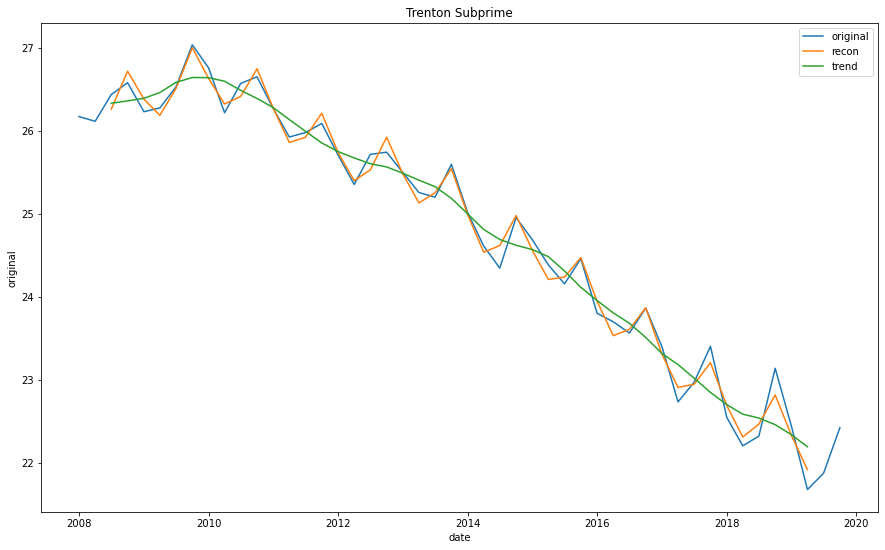

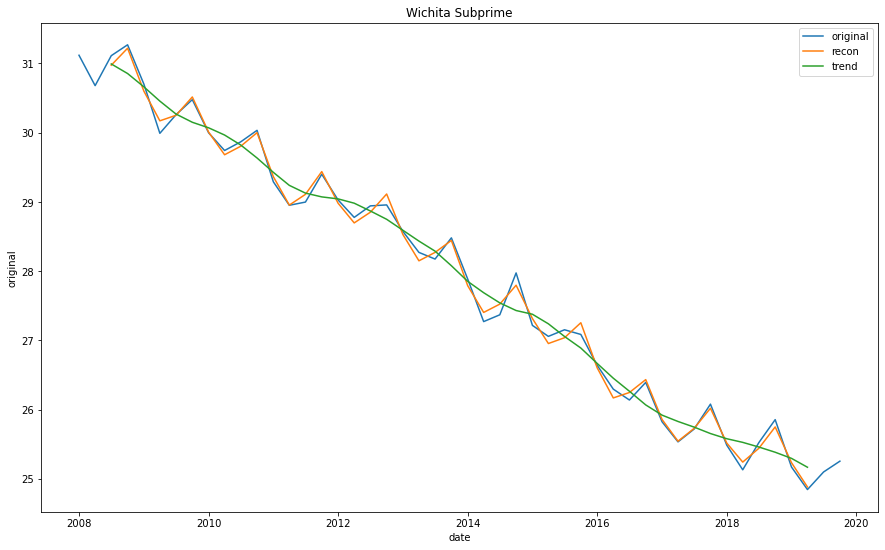

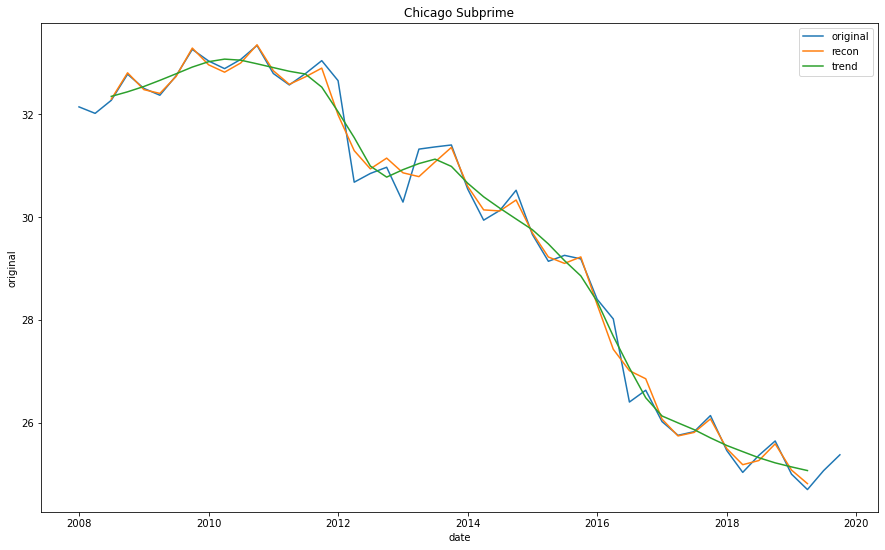

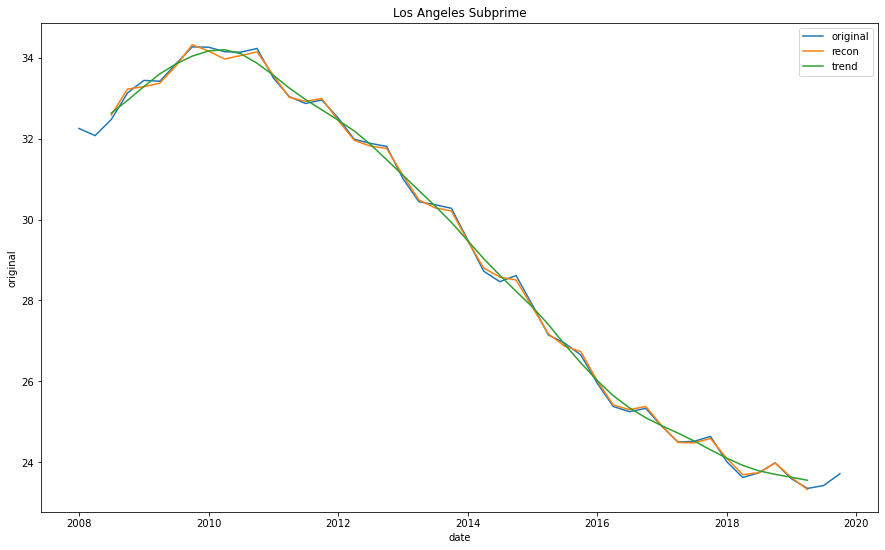

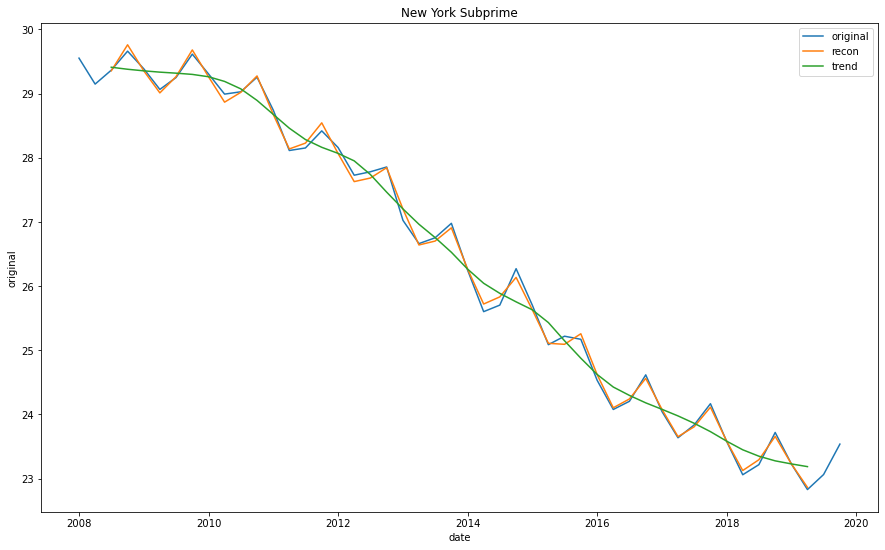

In [300]:
for city in hpi.city.unique():
    df = seasonality['subprime']
    city_df = df[df.city == city]
    fig, ax = plt.subplots(figsize=(15, 9))
    sns.lineplot(data=city_df, x='date', y='original', label= 'original')
    sns.lineplot(data=city_df, x='date', y='recon', label= 'recon')
    sns.lineplot(data=city_df, x='date', y='trend', label= 'trend')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='recon')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='trend')
    plt.title(city + ' Subprime')
    plt.legend()
    plt.show()

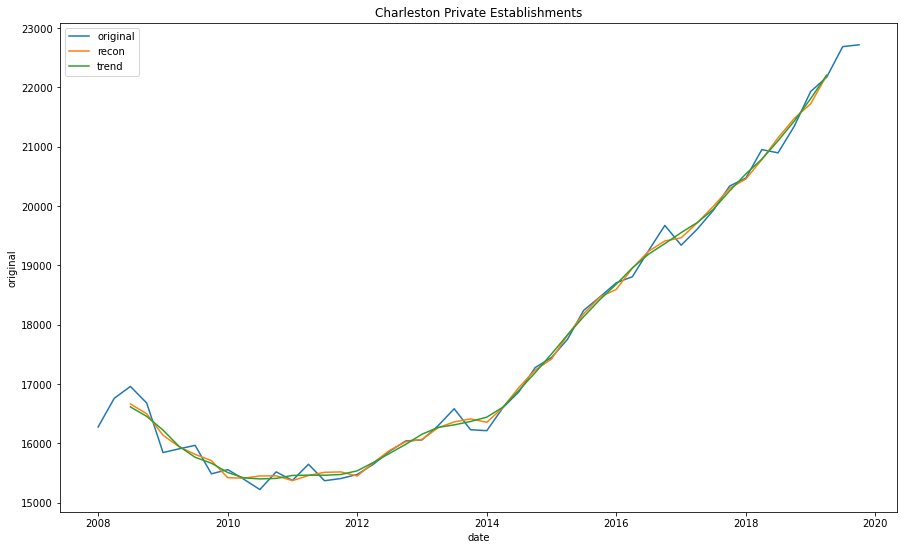

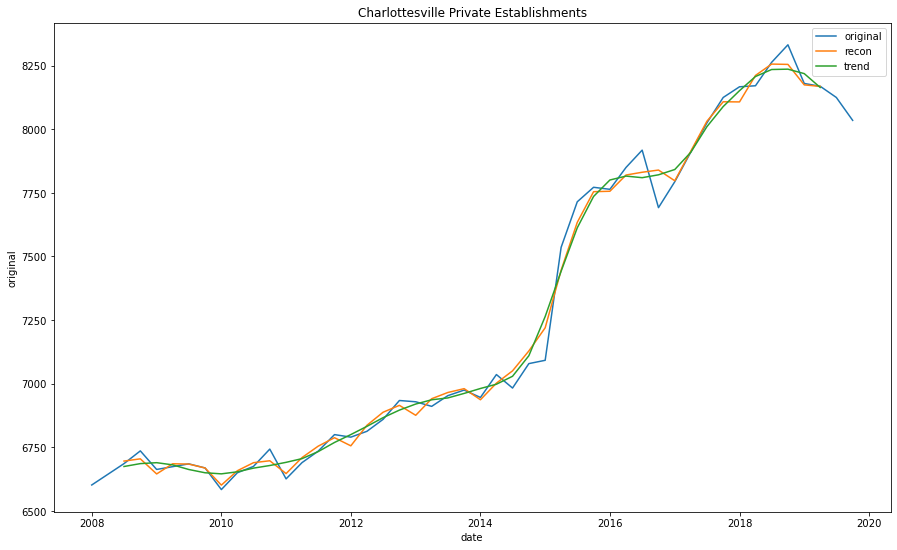

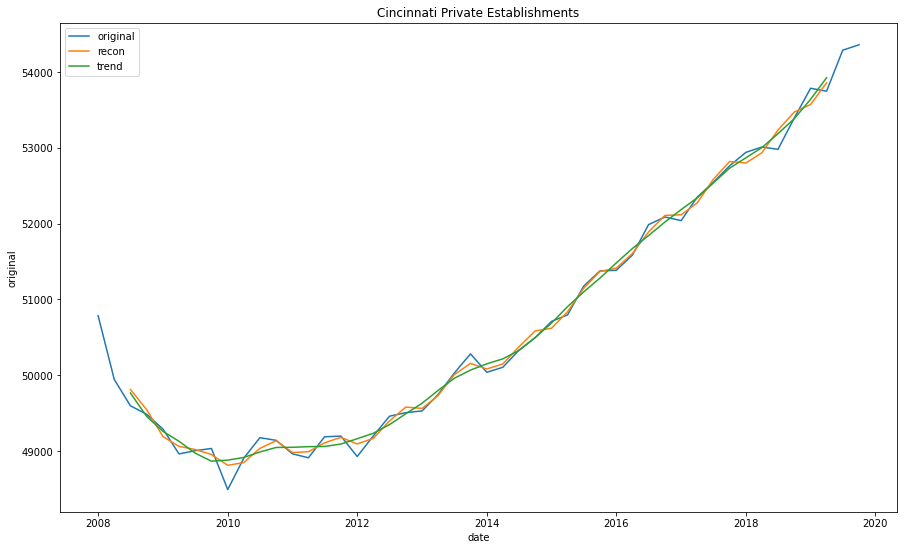

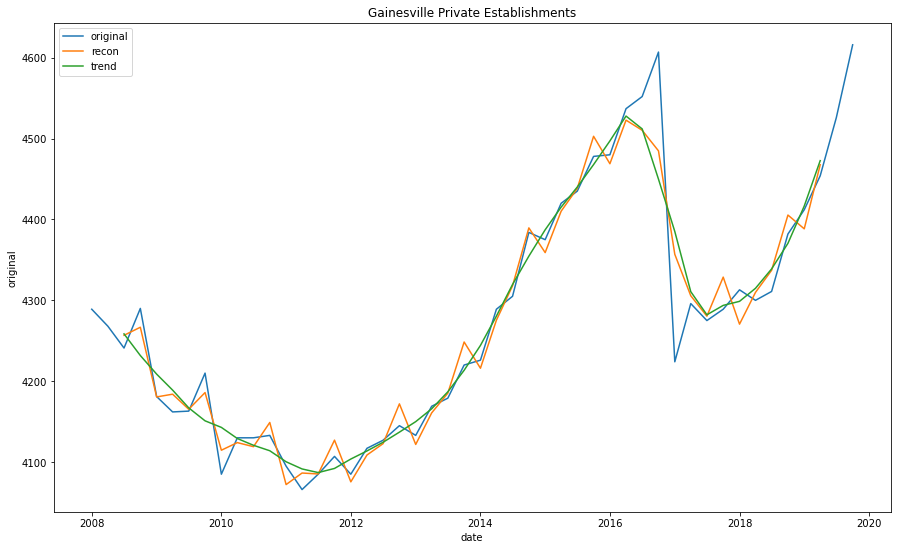

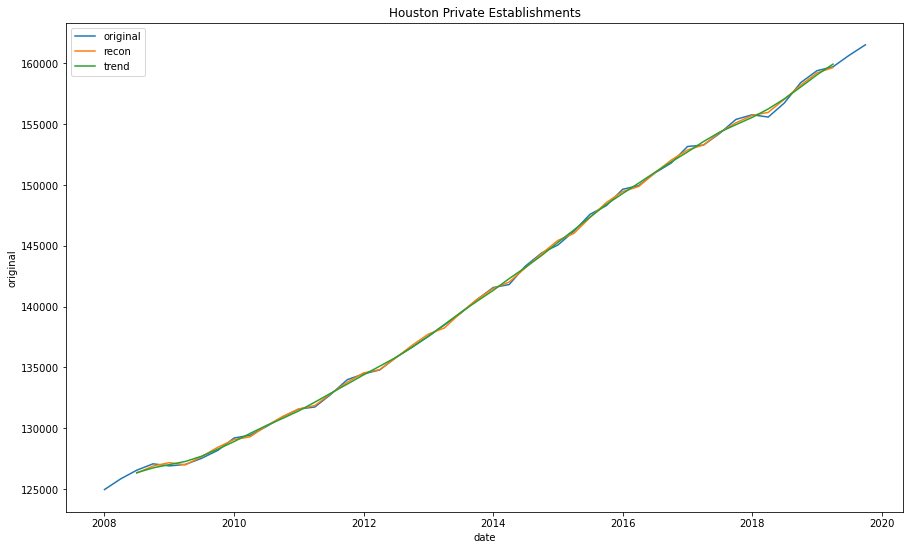

...

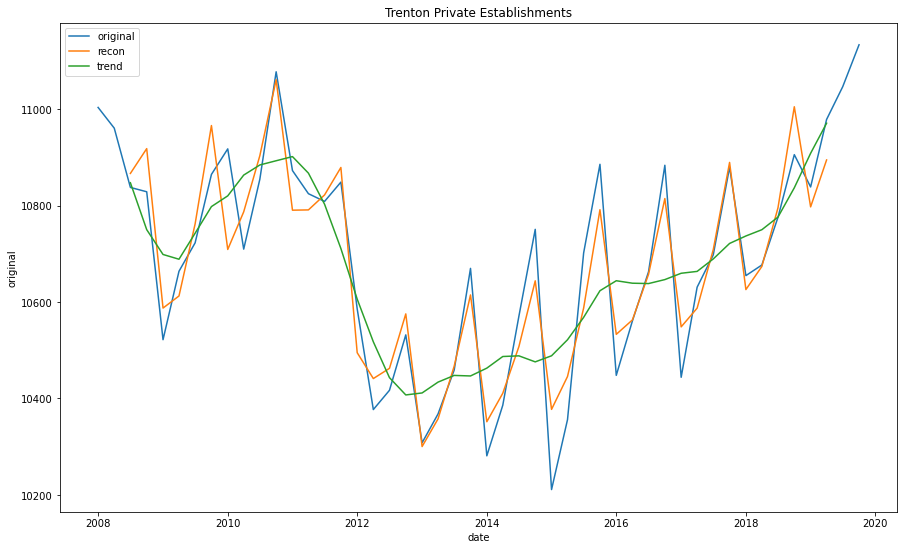

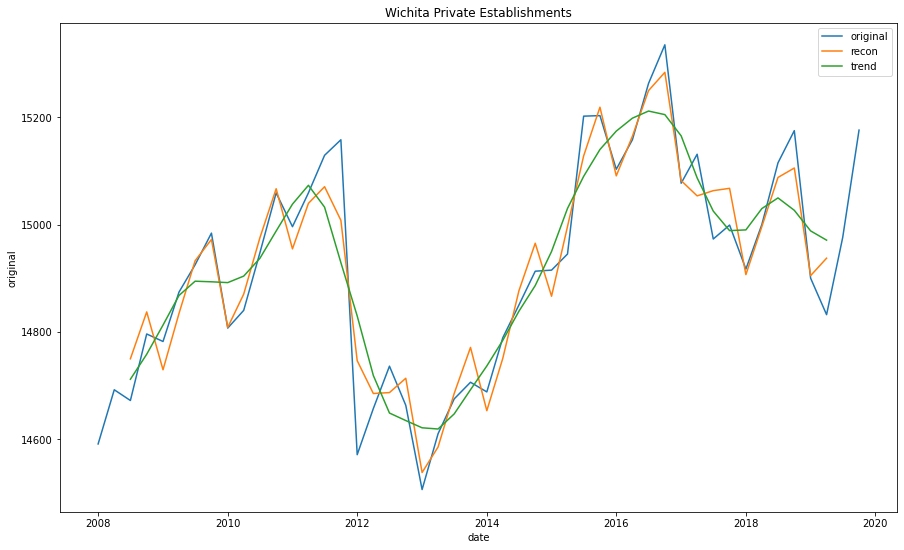

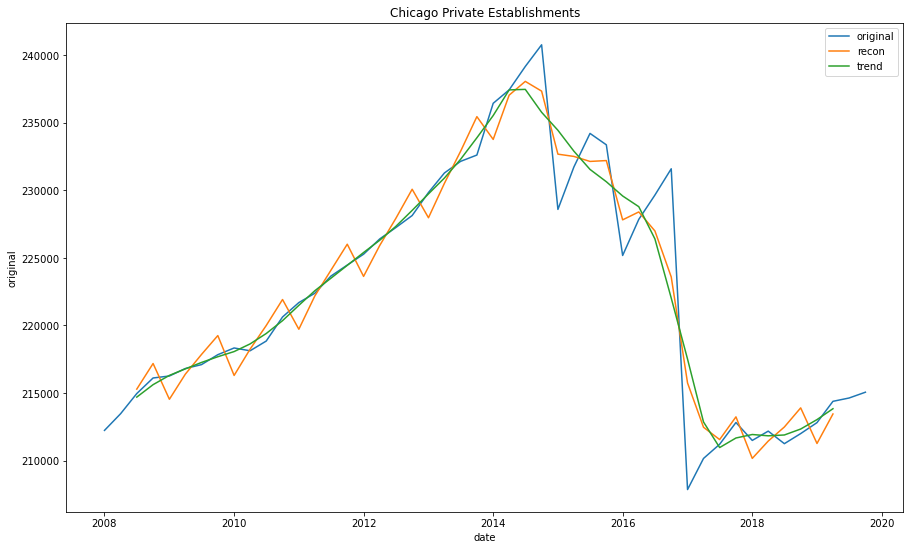

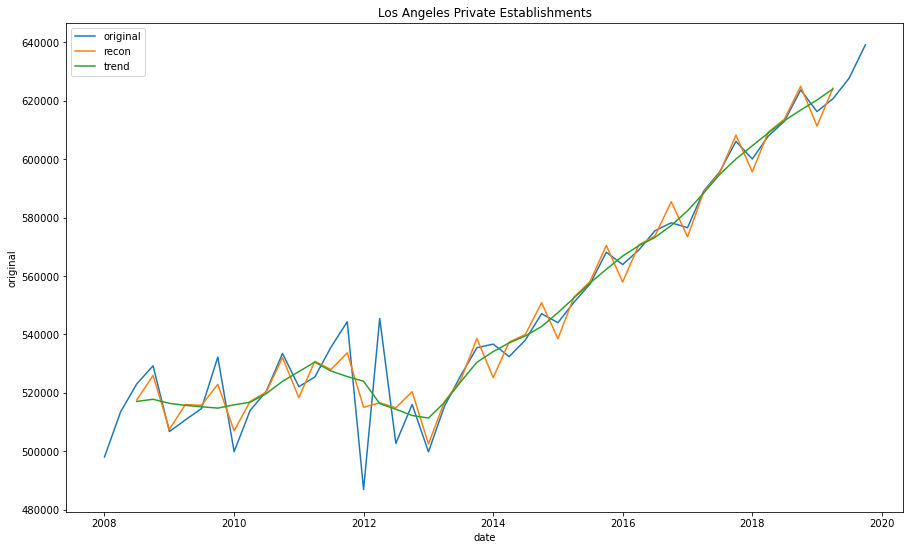

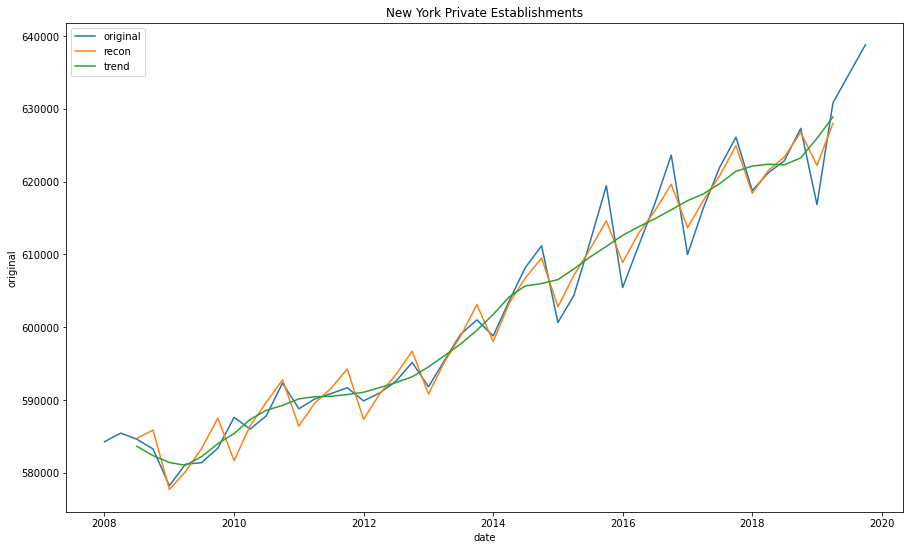

In [301]:
for city in hpi.city.unique():
    df = seasonality['private_establishments']
    city_df = df[df.city == city]
    fig, ax = plt.subplots(figsize=(15, 9))
    sns.lineplot(data=city_df, x='date', y='original', label= 'original')
    sns.lineplot(data=city_df, x='date', y='recon', label= 'recon')
    sns.lineplot(data=city_df, x='date', y='trend', label= 'trend')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='recon')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='trend')
    plt.title(city + ' Private Establishments')
    plt.legend()
    plt.show()

## Experiment with Smoothing

In [302]:
hpi.head()

,date,quarter,msa_state,year,city,hpi,weekly_wages,rpp,population,gdp,unemployment_rate,crimes,subprime,poverty,patents,private_establishments,premature_death_rate,snap
0,2008-01-01,1,SC,2008,Charleston,361.226779,733.576515,97.6410,647.19400,27277.61300,4.8,10083.0,42.546860,13.983937,7.000000,16277.0,395.327521,69915.00
1,2008-04-01,2,SC,2008,Charleston,355.616583,728.179263,97.6635,650.19325,27192.92025,5.1,10058.5,42.203499,14.355264,6.000000,16760.0,393.136641,73917.75
2,2008-07-01,3,SC,2008,Charleston,344.436457,732.479714,97.6860,653.19250,27108.22750,6.0,10034.0,42.138782,14.726591,4.000000,16960.0,390.945760,77920.50
3,2008-10-01,4,SC,2008,Charleston,341.161607,731.680084,97.7085,656.19175,27023.53475,7.0,10009.5,42.177472,15.097918,4.500000,16680.0,388.754880,81923.25
4,2009-01-01,1,SC,2009,Charleston,344.275399,732.465819,97.7310,659.19100,26938.84200,8.2,9985.0,41.945581,15.469245,3.666667,15846.0,386.564000,85926.00


In [313]:
hpi.columns

Index(['date', 'quarter', 'msa_state', 'year', 'city', 'hpi', 'weekly_wages',
       'rpp', 'population', 'gdp', 'unemployment_rate', 'crimes', 'subprime',
       'poverty', 'patents', 'private_establishments', 'premature_death_rate',
       'snap'],
      dtype='object')

In [325]:
cols_to_smooth = ['weekly_wages', 'rpp', 'gdp', 'crimes', 'poverty', 'patents', 'premature_death_rate', 'snap']
hpi_smooth = hpi.copy()
hpi_smooth[cols_to_smooth] = hpi_smooth[cols_to_smooth].ewm(alpha=0.3).mean()

In [326]:
hpi_smooth.private_establishments - hpi.private_establishments

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
955    0.0
956    0.0
957    0.0
958    0.0
959    0.0
Name: private_establishments, Length: 960, dtype: float64

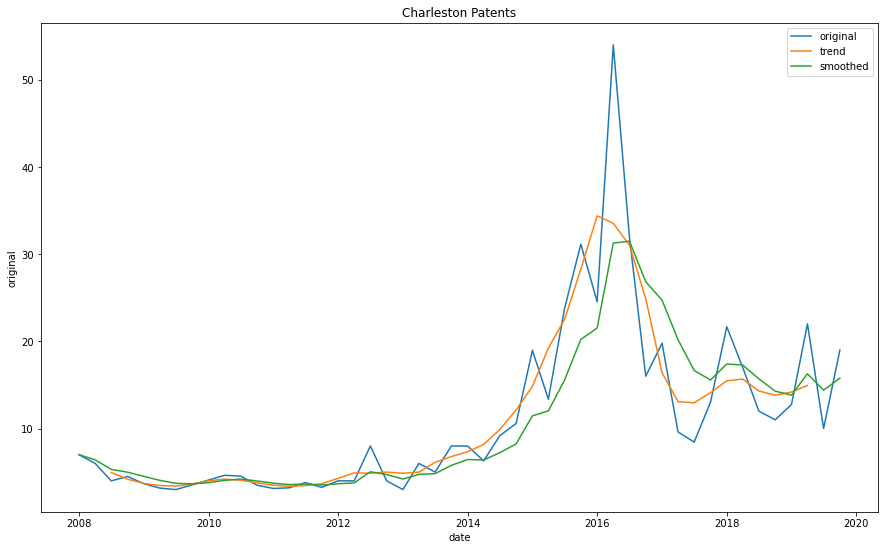

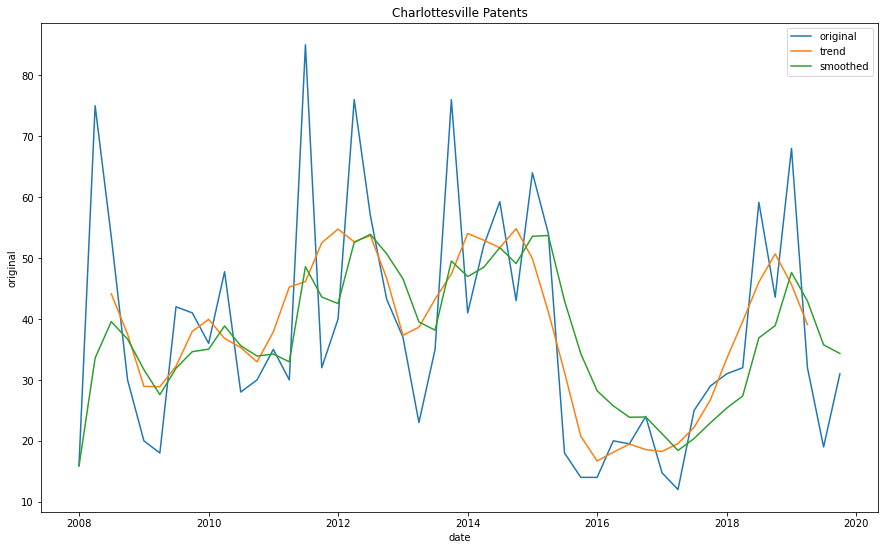

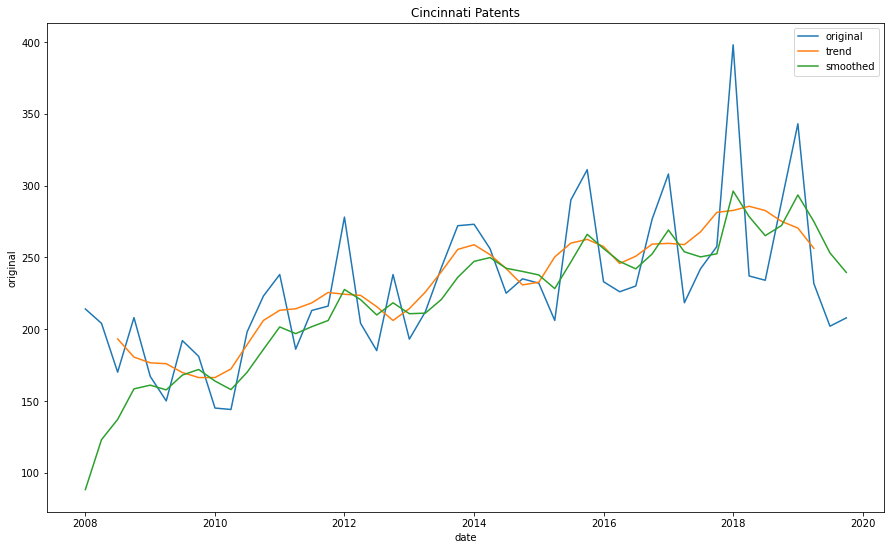

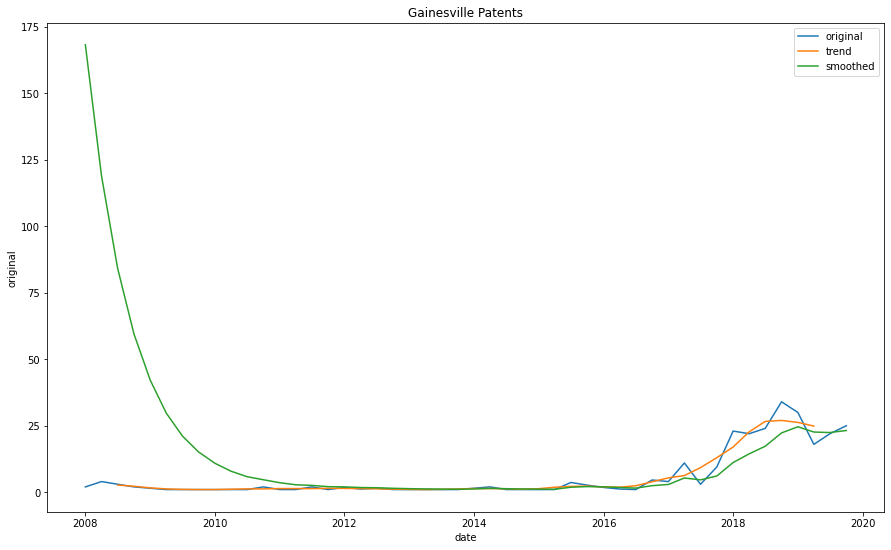

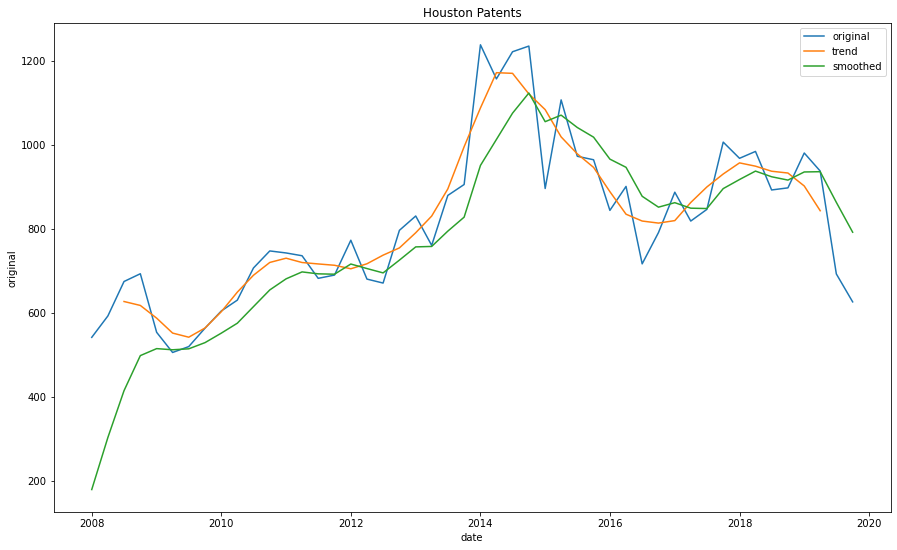

...

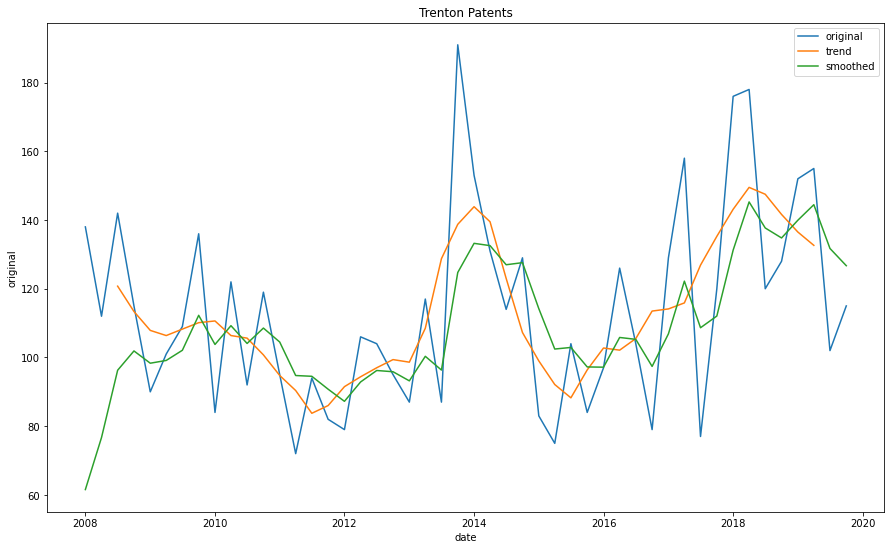

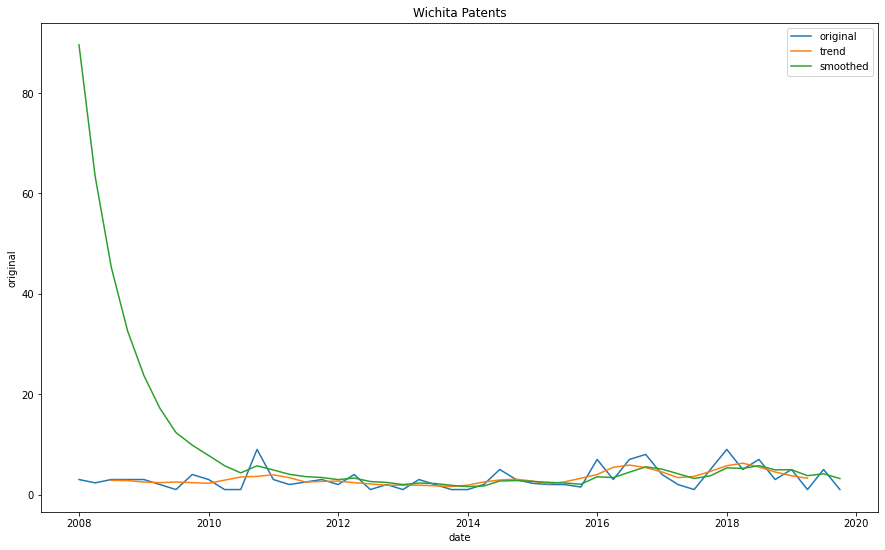

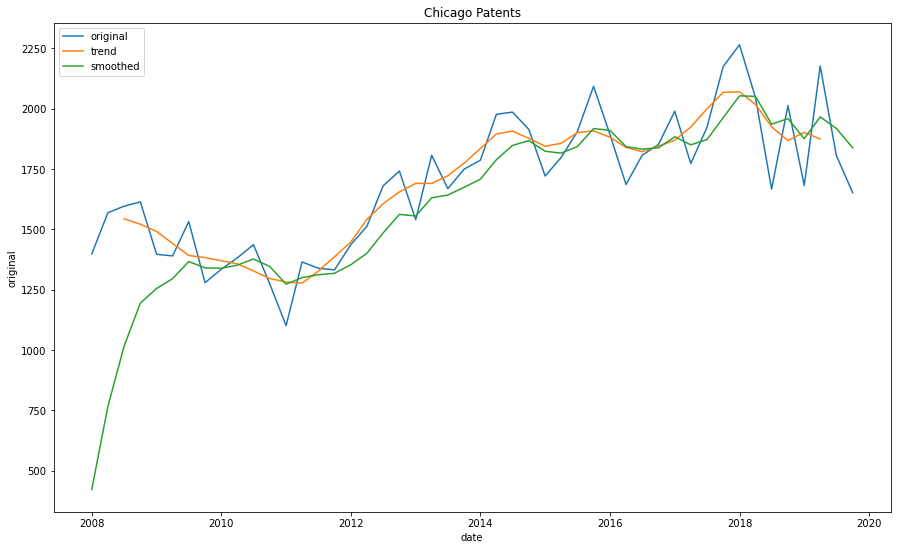

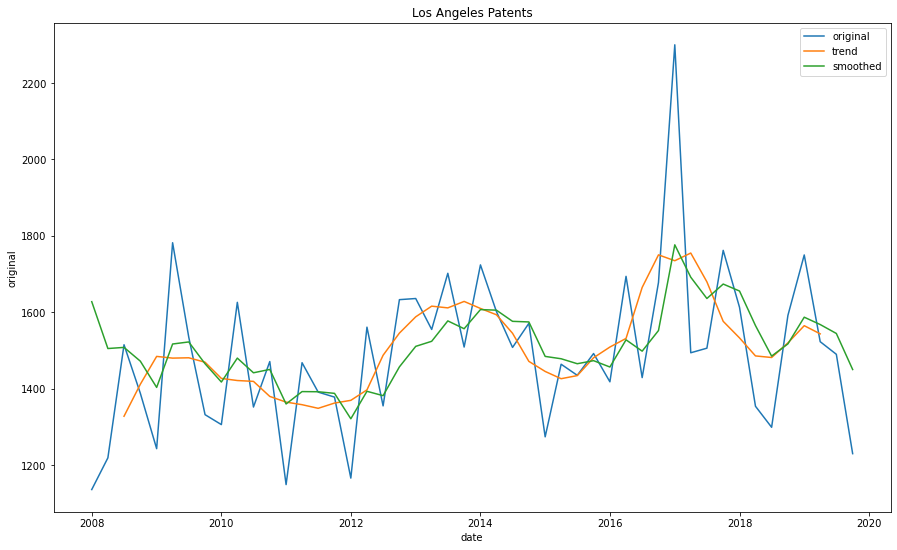

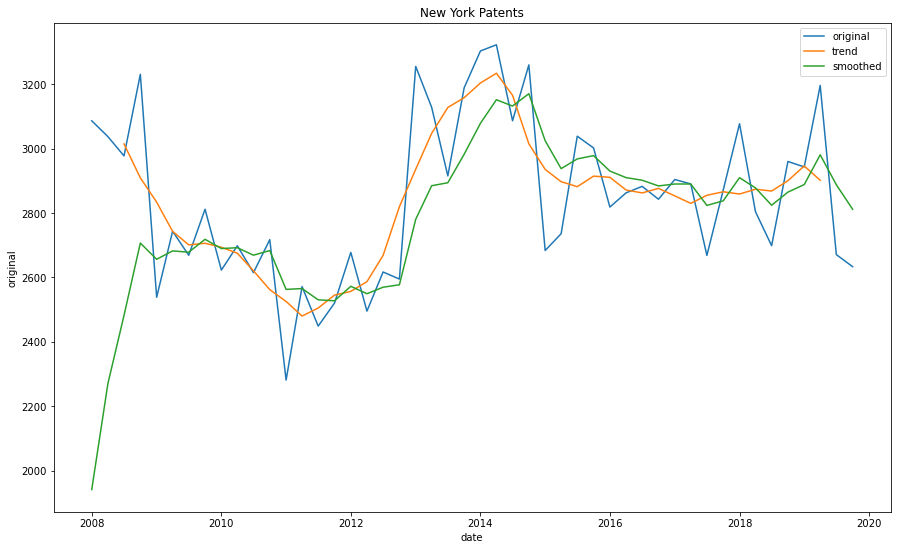

In [327]:
for city in hpi.city.unique():
    df = seasonality['patents']
    city_df = df[df.city == city]
    fig, ax = plt.subplots(figsize=(15, 9))
    sns.lineplot(data=city_df, x='date', y='original', label= 'original')
    #sns.lineplot(data=city_df, x='date', y='recon', label= 'recon')
    sns.lineplot(data=city_df, x='date', y='trend', label= 'trend')
    sns.lineplot(data=hpi_smooth[hpi_smooth.city == city], x='date', y='patents', label = 'smoothed')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='recon')
    #sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='trend')
    plt.title(city + ' Patents')
    plt.legend()
    plt.show()

In [ ]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
for col in hpi.columns:
    if col not in id_vars:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


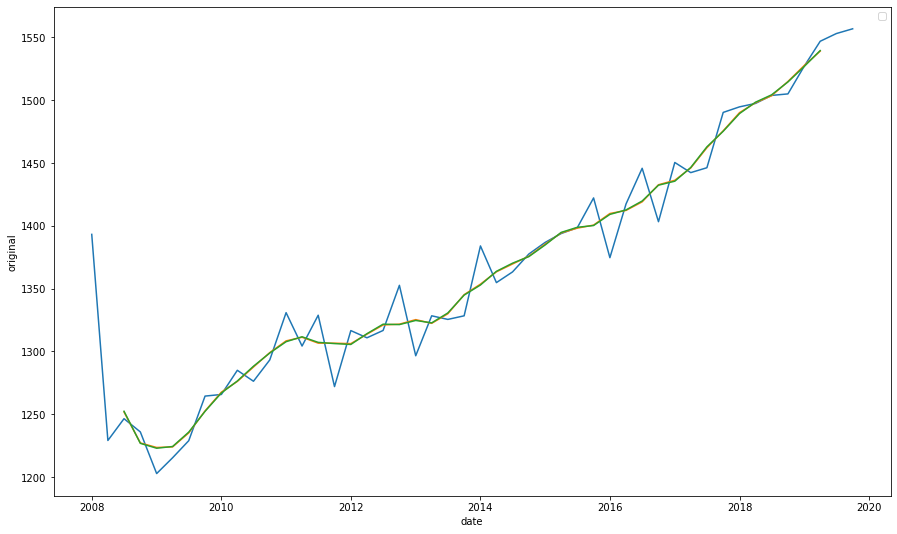

In [254]:
fig, ax = plt.subplots(figsize=(15, 9))
sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='original')
sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='recon')
sns.lineplot(data=ny_seasonality, x=ny_seasonality.index, y='trend')
plt.legend()
plt.show()

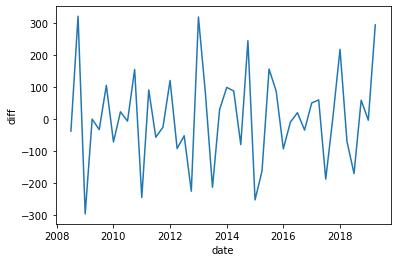

In [233]:
g = sns.FacetGrid(melted, col = 'variable', hue='city', col_wrap=3, height=4, aspect=1)
g.map(plt.plot, 'date', 'value', linewidth=2)
#g.map(plt.axvline(x='observed'))
g.set_titles('{col_name}', size=16)
g.set_axis_labels('Date', 'Normalized/Log Value', fontsize=16)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Time Trends for Predictor Variables', fontsize=16)
g.add_legend()

for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

In [234]:
ny_seasonality

,original,mult,diff
date,,,
2008-01-01,3086.000000,NaN,NaN
2008-04-01,3037.000000,NaN,NaN
2008-07-01,2977.000000,3014.125000,-37.125000
2008-10-01,3230.500000,2908.875000,321.625000
2009-01-01,2538.000000,2833.562500,-295.562500
2009-04-01,2743.000000,2742.612500,0.387500
2009-07-01,2668.500000,2700.787500,-32.287500
2009-10-01,2811.400000,2705.725000,105.675000
2010-01-01,2622.500000,2693.350000,-70.850000


In [ ]:
fig, ax = plt.subplots(figsize=(15, 9))
sns.lineplot(data=ny_decomp_mult, x='trend', y=col, hue='city')
plt.xticks(rotation=90)
plt.title(col)

In [232]:
ny_seasonality = pd.DataFrame({'original' : ny_decomp_add.observed, 'mult' : ny_decomp_mult.trend})

ny_seasonality['diff'] = ny_seasonality.original - ny_seasonality.mult

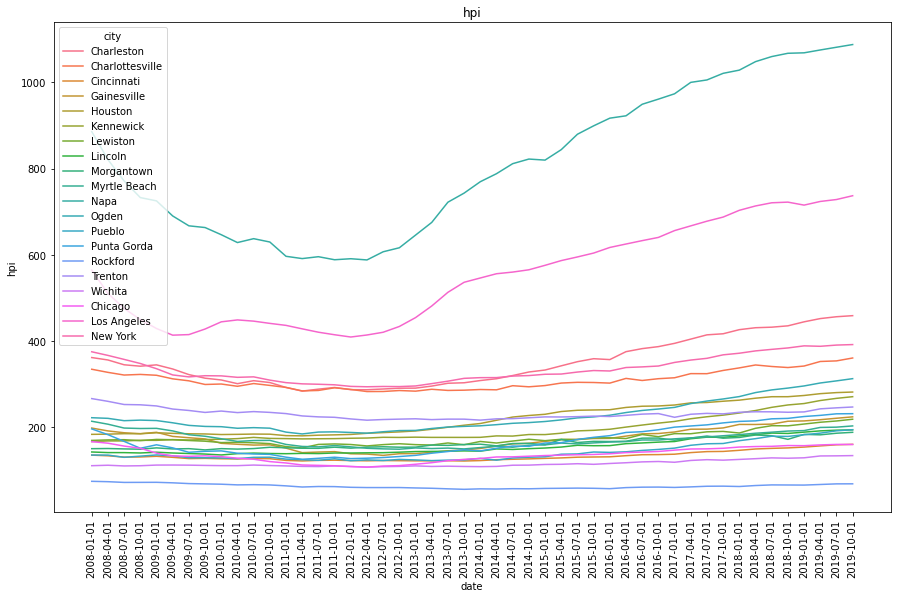

In [161]:
fig, ax = plt.subplots(figsize=(15, 9))
hpi_plot = sns.lineplot(data=hpi, x='date', y='hpi', hue='city')
plt.xticks(rotation=90)
plt.title('hpi')

plt.show()

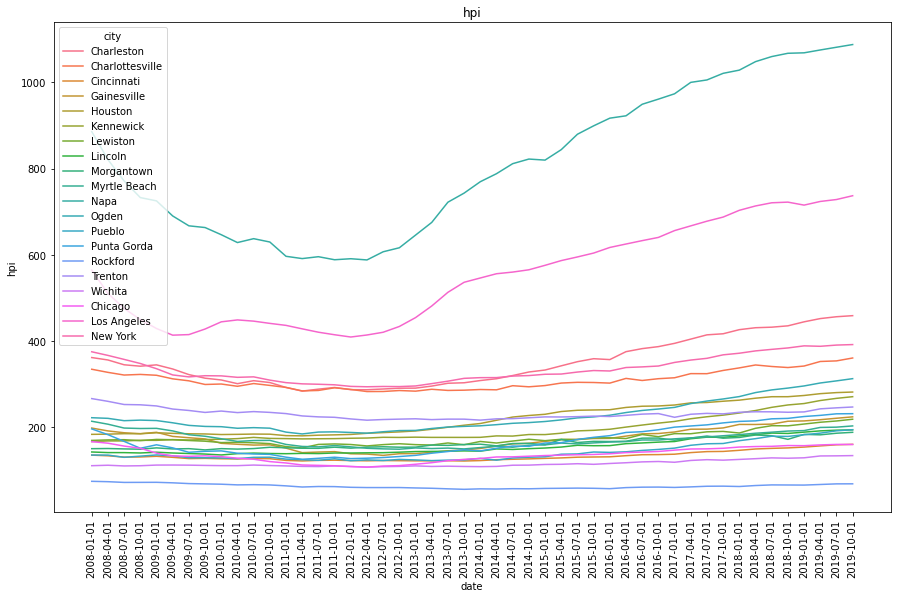

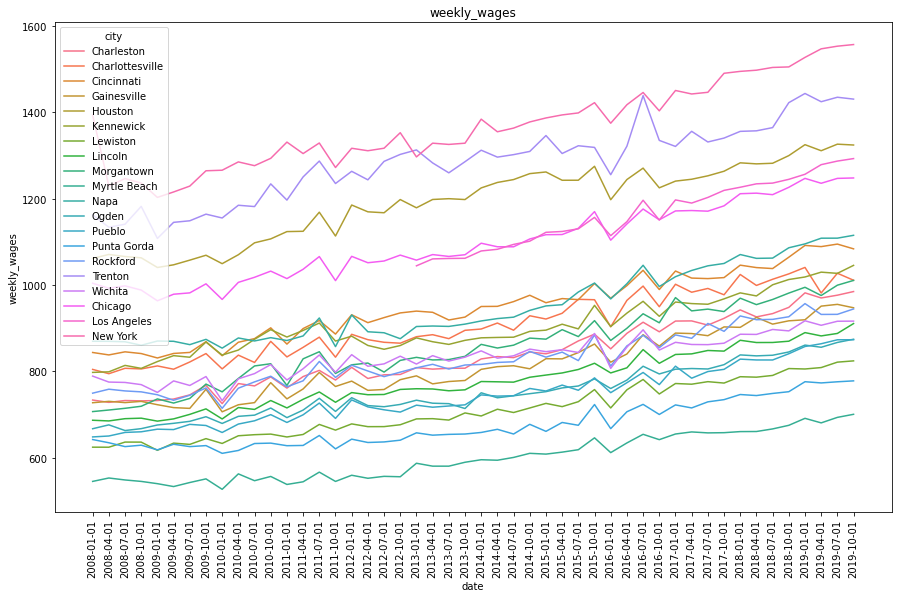

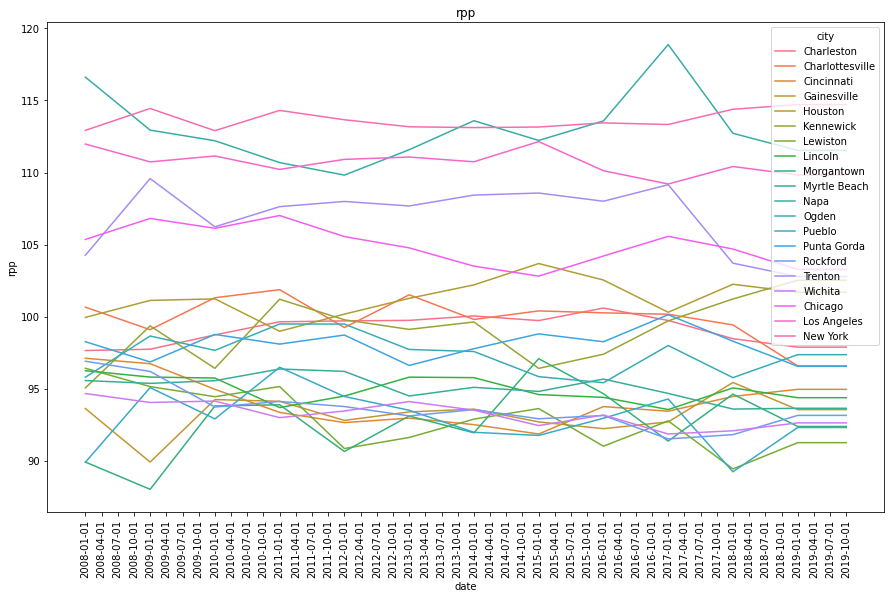

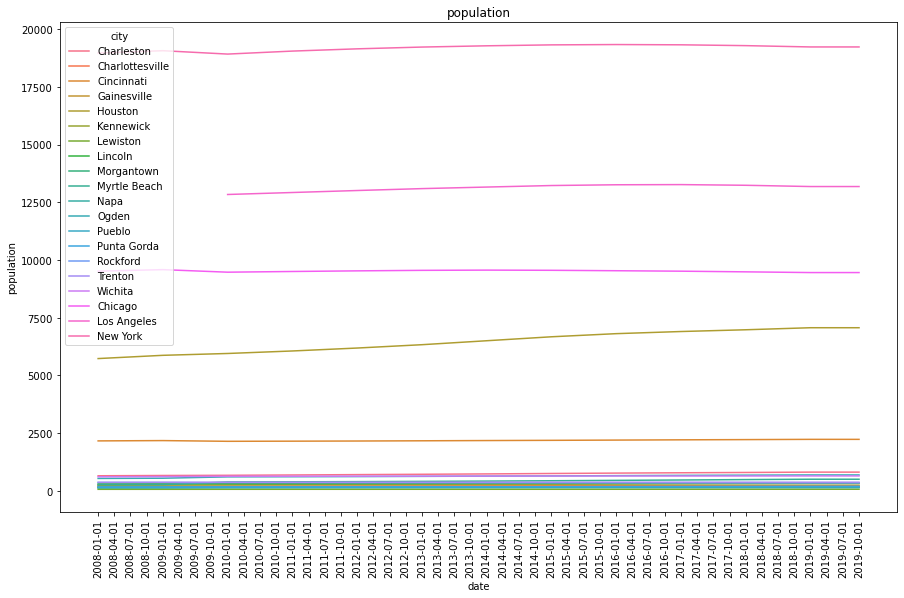

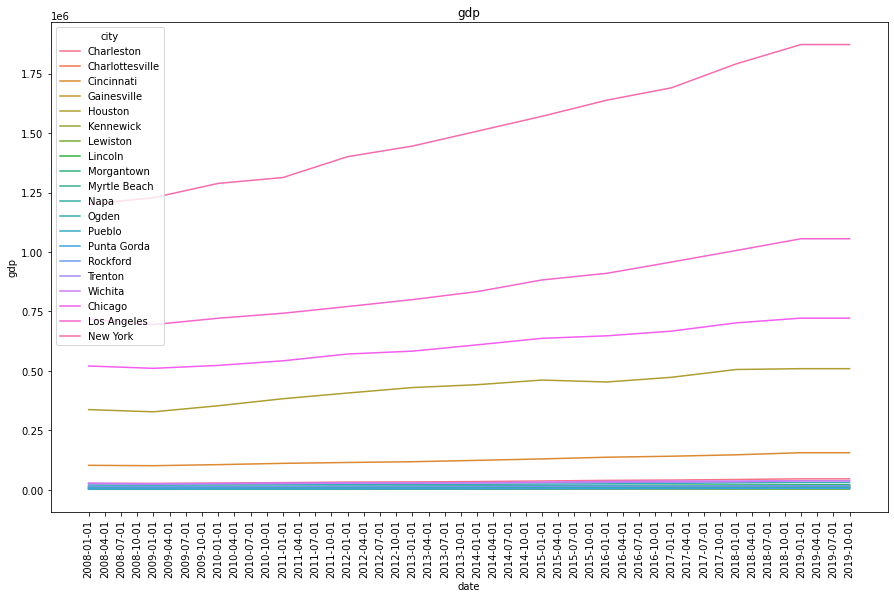

...

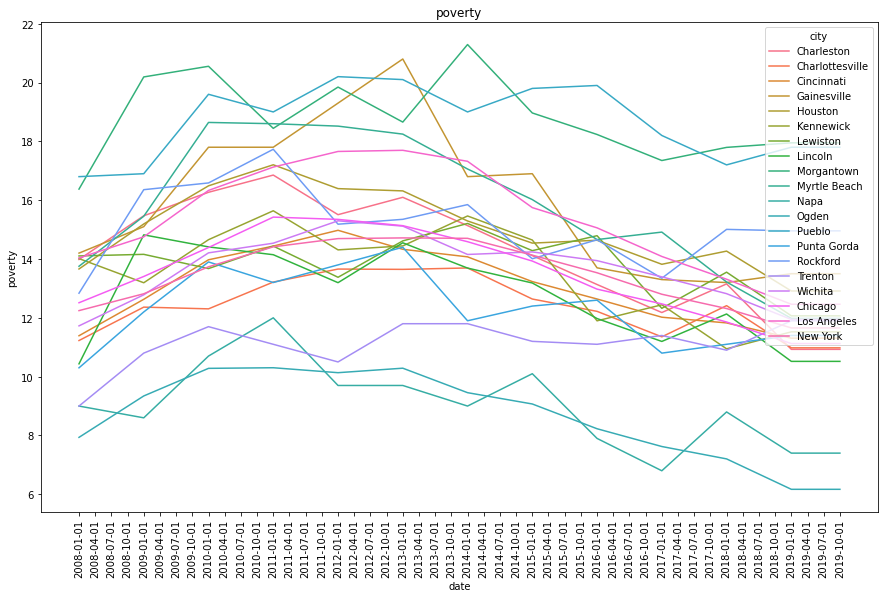

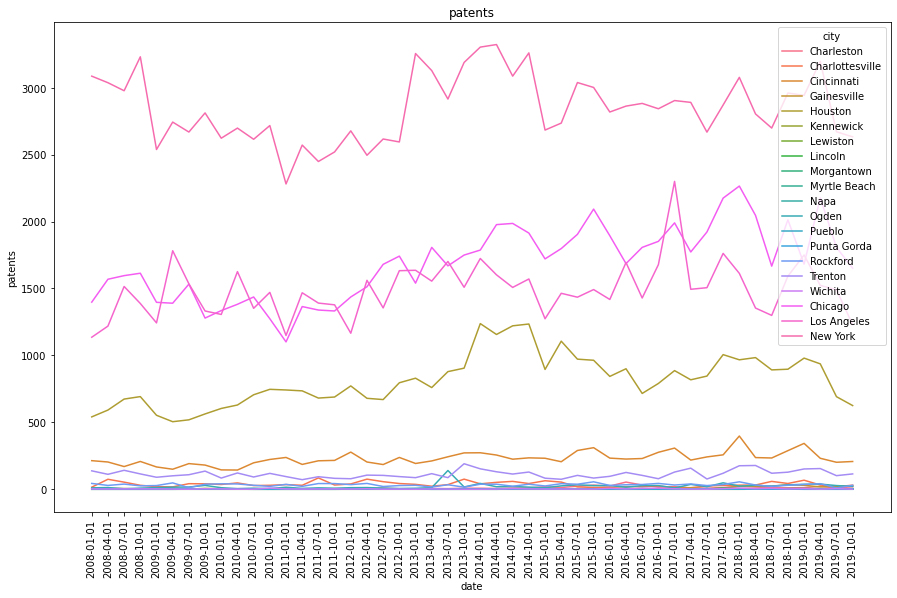

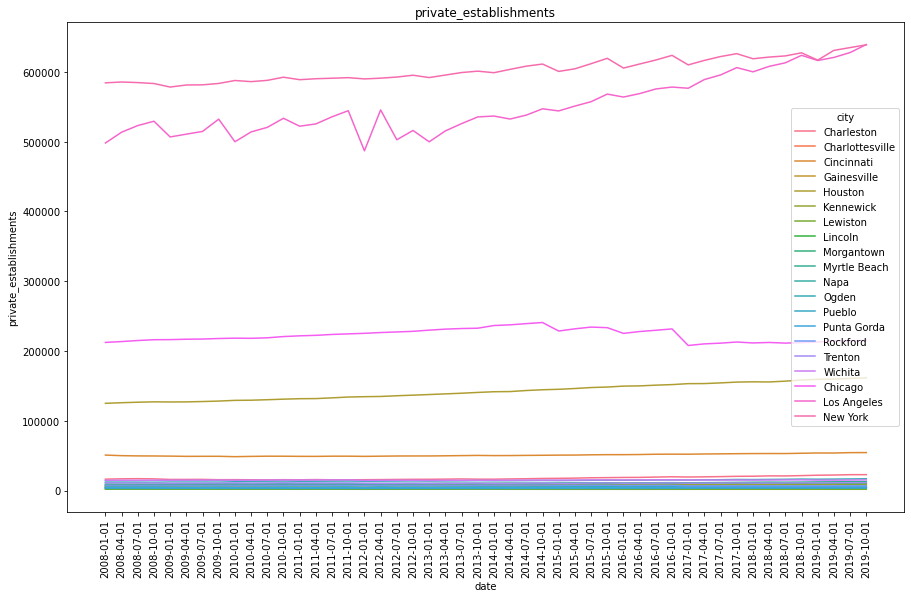

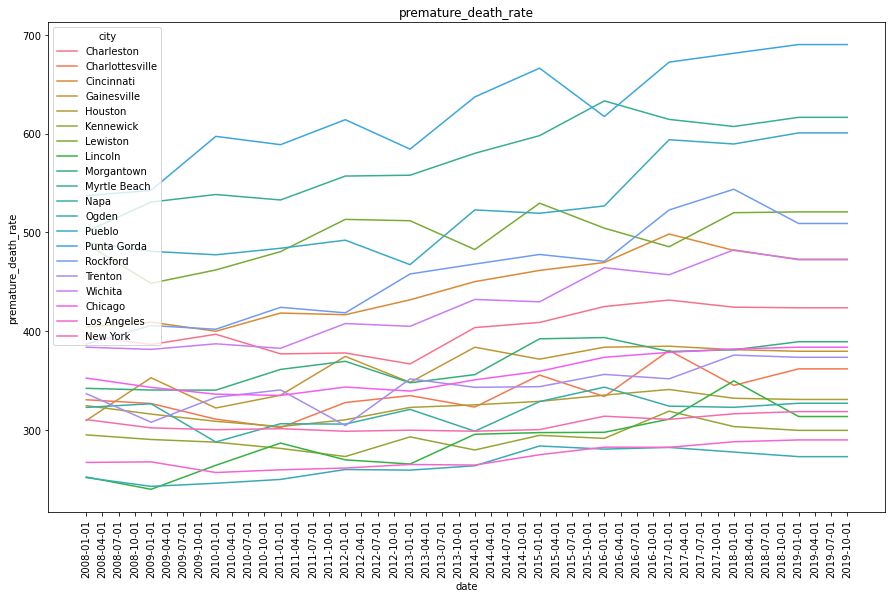

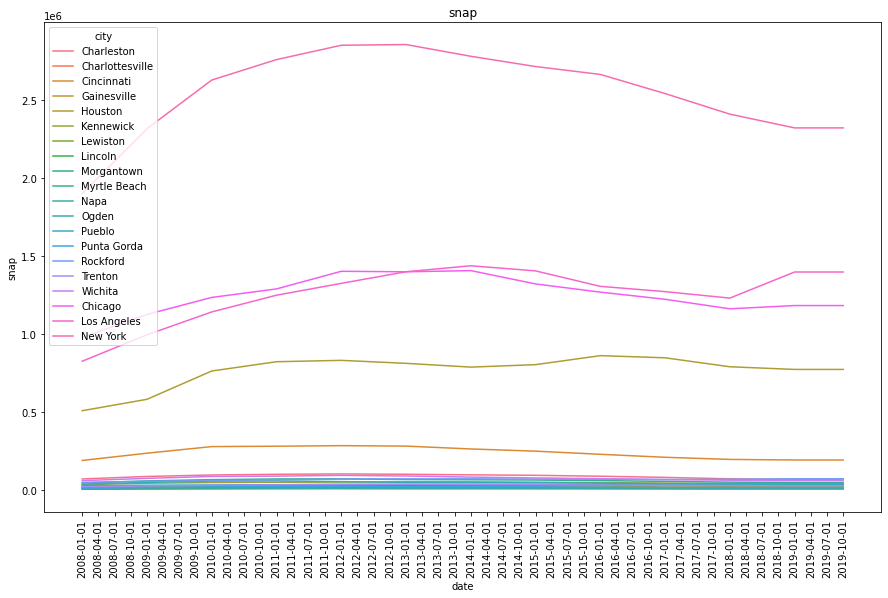

In [156]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
for col in hpi.columns:
    if col not in id_vars:
        fig, ax = plt.subplots(figsize=(15, 9))
        hpi_plot = sns.lineplot(data=hpi, x='date', y=col, hue='city')
        plt.xticks(rotation=90)
        plt.title(col)

        plt.show()

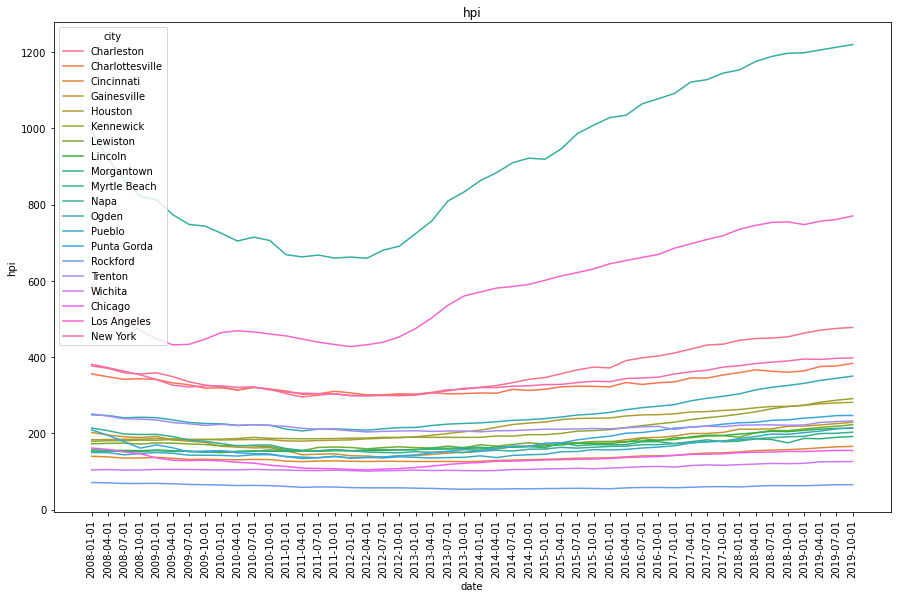

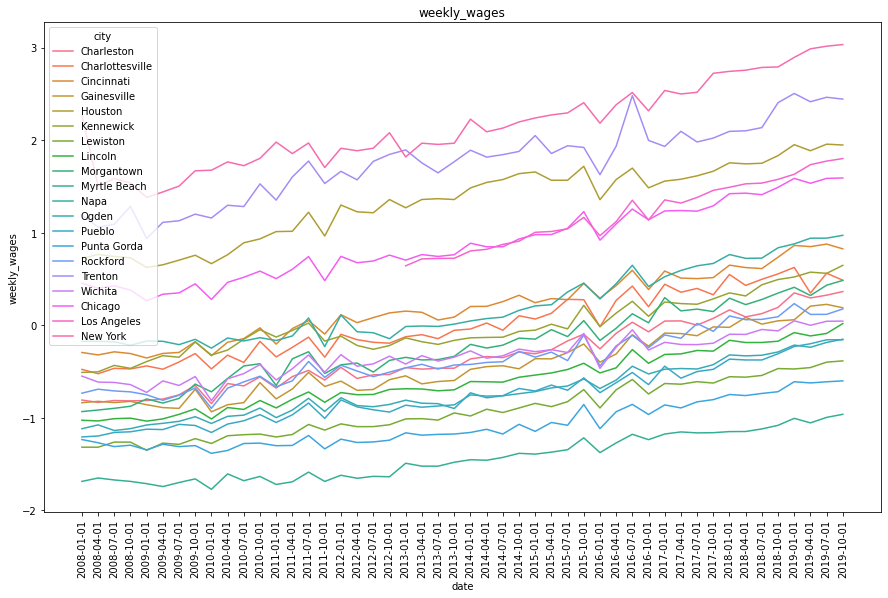

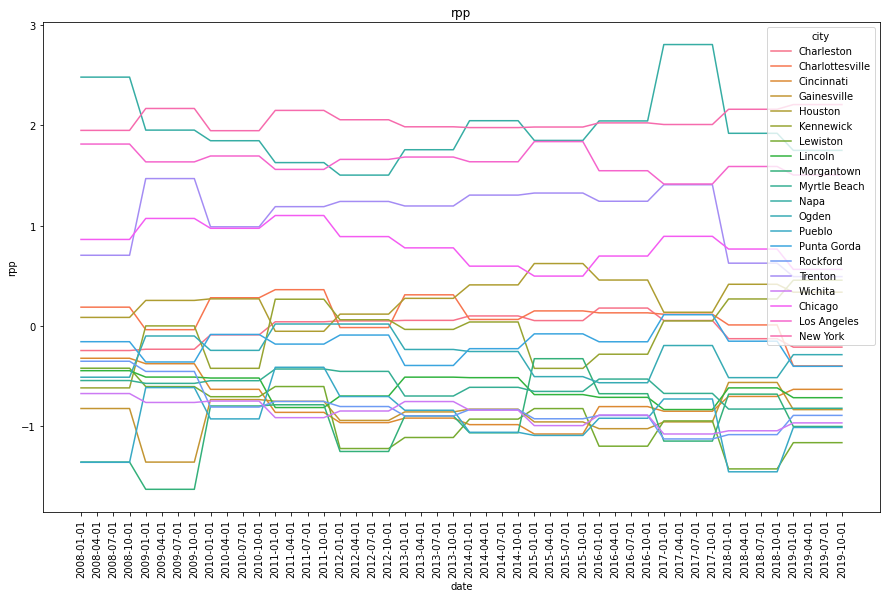

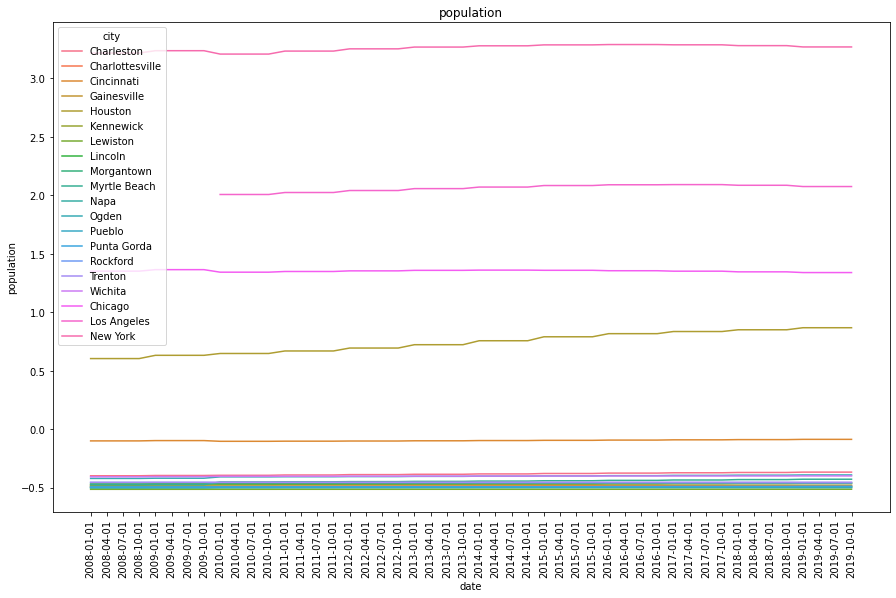

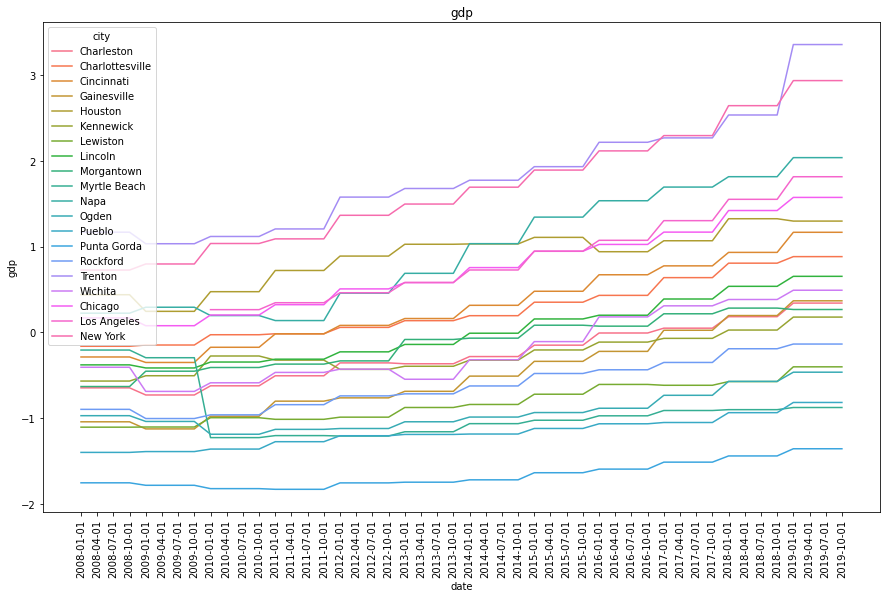

...

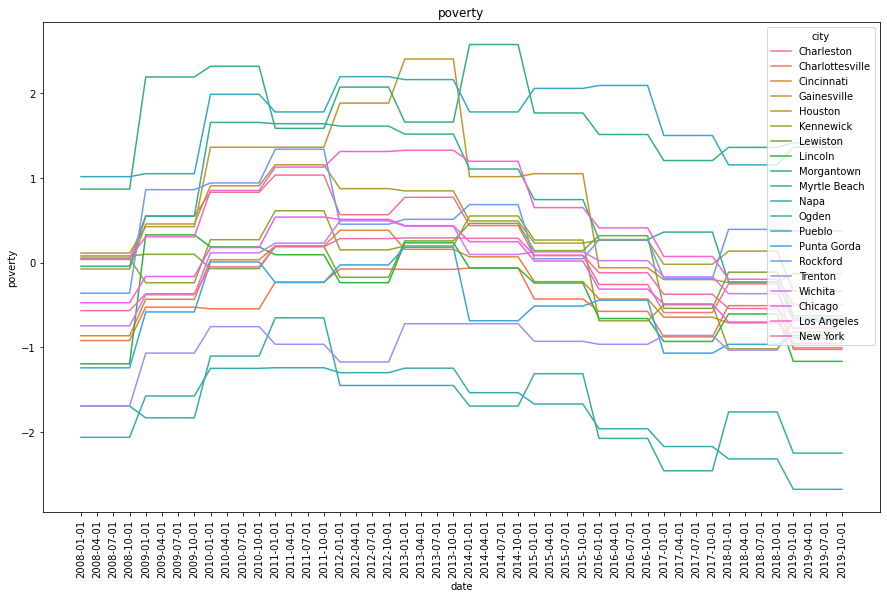

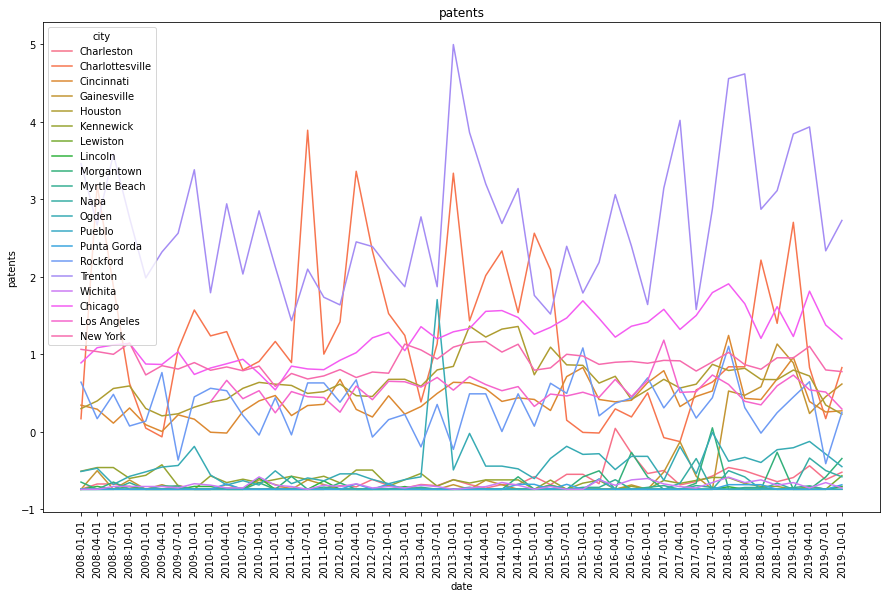

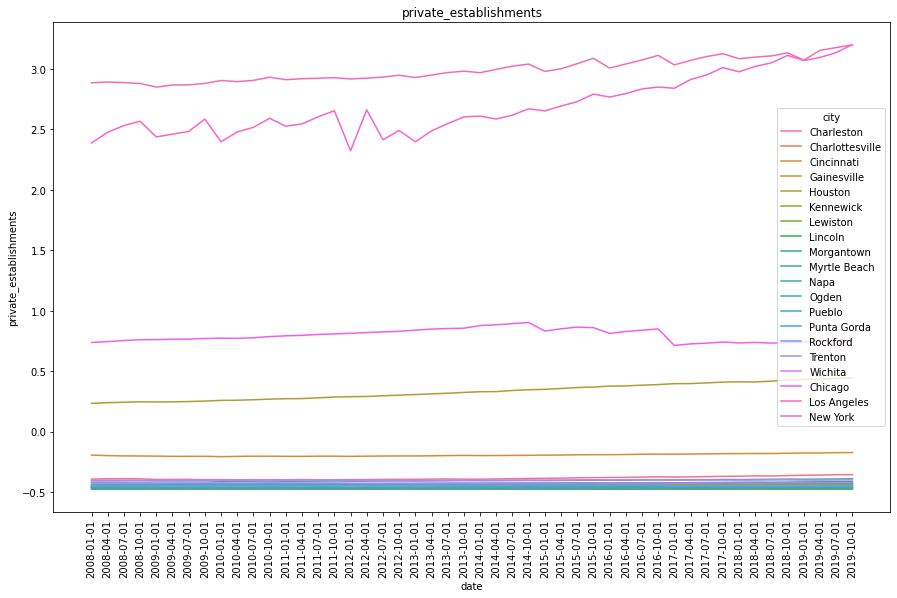

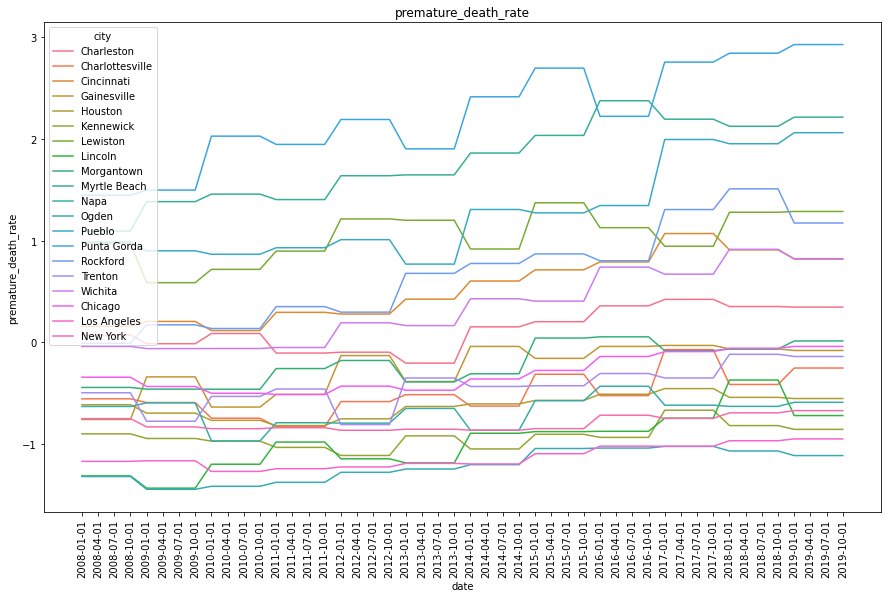

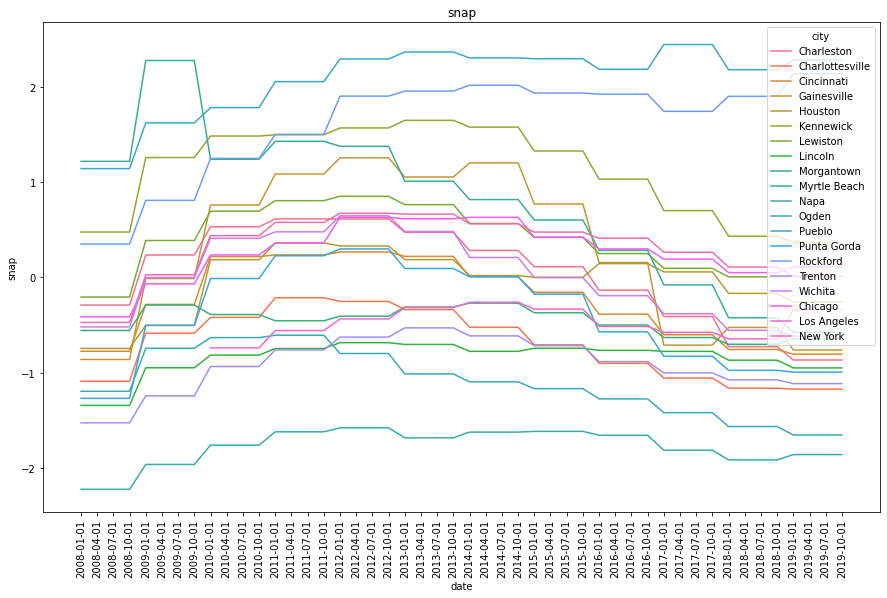

In [34]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
for col in normalized.columns:
    if col not in id_vars:
        fig, ax = plt.subplots(figsize=(15, 9))
        hpi_plot = sns.lineplot(data=normalized, x='date', y=col, hue='city')
        plt.xticks(rotation=90)
        plt.title(col)

        plt.show()

In [ ]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
for col in hpi.columns:
    if col not in id_vars:
        fig, ax = plt.subplots(figsize=(15, 9))
        hpi_plot = sns.lineplot(data=hpi, x='date', y=col, hue='city')
        plt.xticks(rotation=90)
        plt.title(col)

        plt.show()

In [118]:
crimes= pd.read_csv('..\\county-data\\Combined Violent and Property Crime Offenses.csv').query("date < '2020' & date > '2008'")
crimes = crimes.rename(columns={'Combined Violent and Property Crime Offenses' : 'crimes'})

#crimes.crimes.str.replace('.', np.nan)
crimes.crimes = crimes.crimes.replace('.', np.nan)
crimes.crimes = crimes.crimes.astype(float)

In [131]:
crimes.crimes

4       2057.0
5       2131.0
6       1929.0
7       1759.0
8       1568.0
         ...  
1524     343.0
1525     347.0
1526     446.0
1527     461.0
1528     406.0
Name: crimes, Length: 1158, dtype: float64

In [140]:
new_crimes = crimes.copy()
new_crimes.crimes = new_crimes.groupby(['city', 'state', 'county'])['crimes'].apply(lambda group: group.interpolate(method='linear', limit=20, limit_direction='both'))

In [133]:
new_crimes.query("county=='Sedgwick County'")

,date,crimes,msa_state,city,county,state,title,id,frequency,seasonal_adjustment
1301,2010-01-01,942.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1302,2011-01-01,769.8,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1303,2012-01-01,597.6,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1304,2013-01-01,425.4,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1305,2014-01-01,253.2,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1306,2015-01-01,81.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1307,2016-01-01,113.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1308,2017-01-01,158.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1309,2018-01-01,662.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1310,2019-01-01,299.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted


In [124]:
crimes.query("county=='Sedgwick County'")

,date,crimes,msa_state,city,county,state,title,id,frequency,seasonal_adjustment
1301,2010-01-01,942.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1302,2011-01-01,NaN,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1303,2012-01-01,NaN,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1304,2013-01-01,NaN,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1305,2014-01-01,NaN,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1306,2015-01-01,81.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1307,2016-01-01,113.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1308,2017-01-01,158.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1309,2018-01-01,662.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1310,2019-01-01,299.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted


In [122]:
new_crimes.query("county=='Sedgwick County'")

,date,crimes,msa_state,city,county,state,title,id,frequency,seasonal_adjustment
1301,2010-01-01,942.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1302,2011-01-01,769.8,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1303,2012-01-01,597.6,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1304,2013-01-01,425.4,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1305,2014-01-01,253.2,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1306,2015-01-01,81.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1307,2016-01-01,113.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1308,2017-01-01,158.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1309,2018-01-01,662.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted
1310,2019-01-01,299.0,KS,Wichita,Sedgwick County,KS,Combined Violent and Property Crime Offenses K...,FBITC020173,Annual,Not Seasonally Adjusted


In [141]:
new_crimes.query("county=='Campbell County'")

,date,crimes,msa_state,city,county,state,title,id,frequency,seasonal_adjustment
242,2008-01-01,274.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
243,2009-01-01,274.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
244,2010-01-01,274.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
245,2011-01-01,274.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
246,2012-01-01,285.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
247,2013-01-01,281.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
248,2014-01-01,220.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
249,2015-01-01,217.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
250,2016-01-01,236.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted
251,2017-01-01,217.0,OH,Cincinnati,Campbell County,KY,Combined Violent and Property Crime Offenses K...,FBITC021037,Annual,Not Seasonally Adjusted


In [121]:
sumner = crimes.query("county=='Sumner County'")
sumner.crimes.interpolate()

1377    160.0
1378    148.0
1379    136.0
1380    178.0
1381    169.0
1382    180.0
1383    162.0
1384    169.0
1385    162.0
1386    203.0
1387    198.0
1388    168.0
Name: crimes, dtype: float64

In [136]:
top_2 = nulls.sort_values(['city', 'state', 'county', 'date']).groupby(['city', 'state', 'county', 'date']).head(2)
#.query("date < '2010'")

In [137]:
top_2.head(50)

,date,Combined Violent and Property Crime Offenses,msa_state,city,county,state,title,id,frequency,seasonal_adjustment
88,2014-01-01,.,SC,Charleston,Berkeley County,SC,Combined Violent and Property Crime Offenses K...,FBITC045015,Annual,Not Seasonally Adjusted
93,2019-01-01,.,SC,Charleston,Berkeley County,SC,Combined Violent and Property Crime Offenses K...,FBITC045015,Annual,Not Seasonally Adjusted
276,2008-01-01,.,SC,Charleston,Charleston County,SC,Combined Violent and Property Crime Offenses K...,FBITC045019,Annual,Not Seasonally Adjusted
280,2012-01-01,.,SC,Charleston,Charleston County,SC,Combined Violent and Property Crime Offenses K...,FBITC045019,Annual,Not Seasonally Adjusted
283,2015-01-01,.,SC,Charleston,Charleston County,SC,Combined Violent and Property Crime Offenses K...,FBITC045019,Annual,Not Seasonally Adjusted
284,2016-01-01,.,SC,Charleston,Charleston County,SC,Combined Violent and Property Crime Offenses K...,FBITC045019,Annual,Not Seasonally Adjusted
285,2017-01-01,.,SC,Charleston,Charleston County,SC,Combined Violent and Property Crime Offenses K...,FBITC045019,Annual,Not Seasonally Adjusted
286,2018-01-01,.,SC,Charleston,Charleston County,SC,Combined Violent and Property Crime Offenses K...,FBITC045019,Annual,Not Seasonally Adjusted
412,2016-01-01,.,SC,Charleston,Dorchester County,SC,Combined Violent and Property Crime Offenses K...,FBITC045035,Annual,Not Seasonally Adjusted
413,2017-01-01,.,SC,Charleston,Dorchester County,SC,Combined Violent and Property Crime Offenses K...,FBITC045035,Annual,Not Seasonally Adjusted


In [157]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
divide_by_pop = ['gdp', 'crimes', 'patents', 'snap']
cols_to_leave = id_vars + ['hpi']

normalized = fred_msa.normalize_data(hpi, cols_to_divide=divide_by_pop, cols_not_normalized=cols_to_leave, cols_log_trans=[])

In [4]:
normalized.head()

,quarter,date,msa_state,year,city,hpi,weekly_wages,rpp,population,gdp,unemployment_rate,crimes,subprime,poverty,patents,private_establishments,premature_death_rate,snap
0,1,2008-01-01,SC,2008,Charleston,376.359979,-0.807208,-0.243628,-0.399332,-0.646161,-0.549596,0.627018,2.503624,0.036045,-0.742632,-0.394235,0.073017,-0.290114
1,2,2008-04-01,SC,2008,Charleston,370.514750,-0.832384,-0.243628,-0.399332,-0.646161,-0.433065,0.627018,2.441167,0.036045,-0.674016,-0.391446,0.073017,-0.290114
2,3,2008-07-01,SC,2008,Charleston,358.866246,-0.812324,-0.243628,-0.399332,-0.646161,-0.083473,0.627018,2.429395,0.036045,-0.674016,-0.390291,0.073017,-0.290114
3,4,2008-10-01,SC,2008,Charleston,355.454198,-0.816054,-0.243628,-0.399332,-0.646161,0.304962,0.627018,2.436433,0.036045,-0.708324,-0.391908,0.073017,-0.290114
4,1,2009-01-01,SC,2009,Charleston,358.698440,-0.812389,-0.230711,-0.396965,-0.729257,0.771085,1.263382,2.394252,0.552291,-0.742632,-0.396724,-0.011920,0.235471


C:\Users\tgule\AppData\Local\Temp/ipykernel_23768/1313775411.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


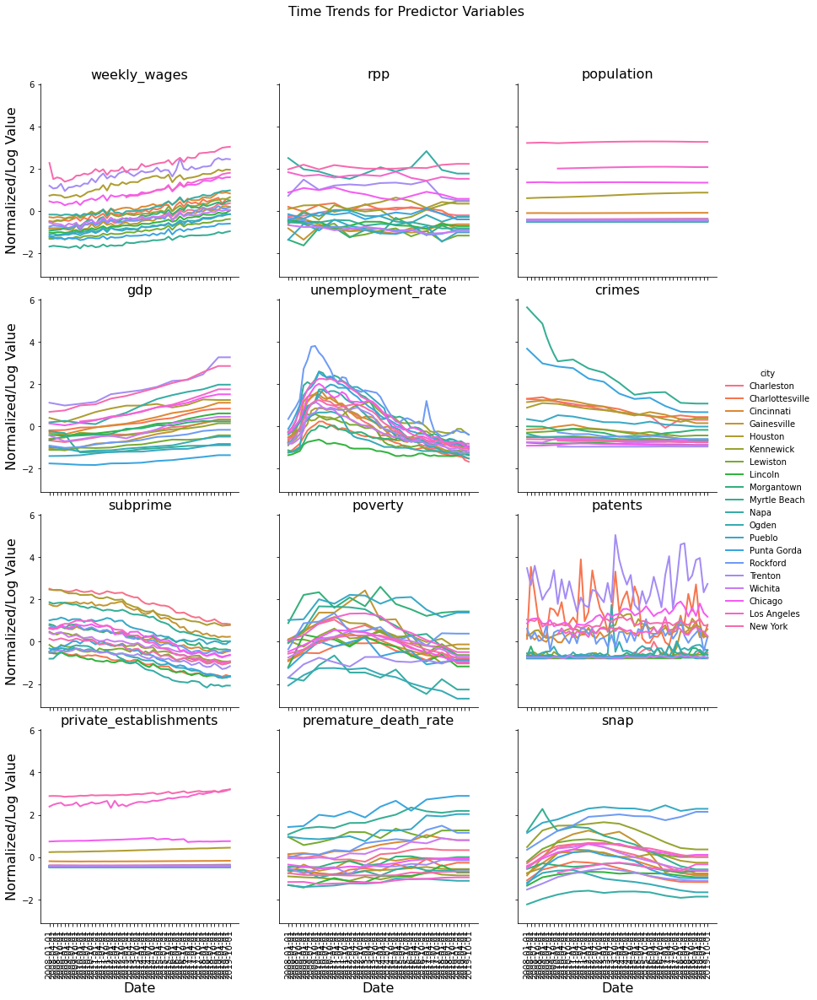

In [158]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
cols_to_ignore = ['hpi']
df = normalized

trim_df = df.drop(columns=cols_to_ignore)
melted = pd.melt(trim_df, id_vars=id_vars)

g = sns.FacetGrid(melted, col = 'variable', hue='city', col_wrap=3, height=4, aspect=1)
g.map(plt.plot, 'date', 'value', linewidth=2)
#g.map(plt.axvline(x='observed'))
g.set_titles('{col_name}', size=16)
g.set_axis_labels('Date', 'Normalized/Log Value', fontsize=16)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Time Trends for Predictor Variables', fontsize=16)
g.add_legend()

for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

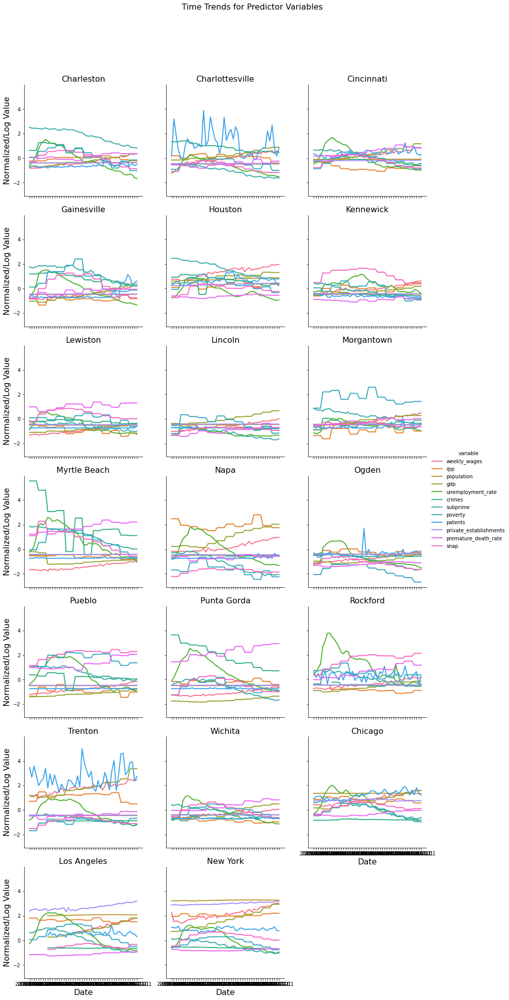

In [7]:
id_vars = ['quarter', 'date', 'msa_state', 'year', 'city']
cols_to_ignore = ['hpi']
df = normalized

trim_df = df.drop(columns=cols_to_ignore)
melted = pd.melt(trim_df, id_vars=id_vars)

g = sns.FacetGrid(melted, col = 'city', hue='variable', col_wrap=3, height=4, aspect=1)
g.map(plt.plot, 'date', 'value', linewidth=2)
#g.map(plt.axvline(x='observed'))
g.set_titles('{col_name}', size=16)
g.set_axis_labels('Date', 'Normalized/Log Value', fontsize=16)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Time Trends for Predictor Variables', fontsize=16)
g.add_legend()